<a href="https://colab.research.google.com/github/mmandour22/Edge-AI-Cooperative-V2V/blob/main/Edge_AI_Based_Cooperative_V2V_Communication_System_V2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install torch torchvision torchaudio
!pip install datasets torchvision torch
!pip install pandas numpy matplotlib scikit-learn
!pip install networkx
!pip install flwr  # For federated learning

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 125.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 102.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 42.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 107.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvji

# **PHASE ONE: DOWNLOAD DATASET**

# **Get kaggle BDD100K Dataset**

In [ ]:
"""

# STEP 1: Install required tools
!pip install kagglehub --quiet

# STEP 2: Authenticate with Kaggle
from google.colab import auth
auth.authenticate_user()

from google.colab import drive
drive.mount('/content/drive')

!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/kaggle/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


# STEP 3: Download the dataset
drive_path = "/content/drive/MyDrive/bdd100k_dataset"
import os
os.makedirs(drive_path, exist_ok=True)

import kagglehub

# Temporarily download to default cache
temp_path = kagglehub.dataset_download("marquis03/bdd100k")

# Now move the dataset to your Google Drive
import shutil

shutil.copytree(temp_path, drive_path, dirs_exist_ok=True)

print("✅ Dataset copied to Google Drive at:", drive_path)


"""

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Unmount first
!fusermount -u /content/drive

from google.colab import drive
drive.mount('/content/drive')

import os

drive_path = "/content/drive/MyDrive/bdd100k_dataset"

"""

total_files = sum([len(files) for _, _, files in os.walk(drive_path)])
print(f"📦 Files copied so far: {total_files}")

"""

Mounted at /content/drive


'\n\ntotal_files = sum([len(files) for _, _, files in os.walk(drive_path)])\nprint(f"📦 Files copied so far: {total_files}")\n\n'

In [ ]:
import os

# Define the path to your dataset root in Google Drive
drive_path = "/content/drive/MyDrive/bdd100k_dataset"

# Walk through the folder structure and print out directories and a few sample files
for root, dirs, files in os.walk(drive_path):
    print(f"📁 Root: {root}")
    print(f"📂 Subfolders: {dirs}")
    print(f"📄 Files: {files[:5]}")  # Show only the first 5 files
    print("-" * 60)


📁 Root: /content/drive/MyDrive/bdd100k_dataset
📂 Subfolders: ['val', 'test', 'train']
📄 Files: []
------------------------------------------------------------
📁 Root: /content/drive/MyDrive/bdd100k_dataset/val
📂 Subfolders: ['annotations', 'images', 'yolo_labels']
📄 Files: ['bdd_val_coco_temp.json', 'bdd_val_coco_done.txt', 'bdd_val_coco_backup.json', 'bdd_val_coco.json']
------------------------------------------------------------
📁 Root: /content/drive/MyDrive/bdd100k_dataset/val/annotations
📂 Subfolders: []
📄 Files: ['bdd100k_labels_images_val.json']
------------------------------------------------------------
📁 Root: /content/drive/MyDrive/bdd100k_dataset/val/images
📂 Subfolders: []
📄 Files: ['c80565a4-c813cdc0.jpg', 'c854d83c-ab3b375a.jpg', 'c7eddd1b-73993ae6.jpg', 'c7e9dd39-2e5a6648.jpg', 'c8650e15-38bef9dc.jpg']
------------------------------------------------------------
📁 Root: /content/drive/MyDrive/bdd100k_dataset/val/yolo_labels
📂 Subfolders: []
📄 Files: ['c8069625-0a547aca


🔍 Exploring TRAIN split...
--------------------------------------------------
📸 Sample images in TRAIN: ['af3f1d6e-c7852d70.jpg', 'af647489-0d591961.jpg', 'af20f5ca-ff3f7a18.jpg', 'af36ccbc-45a50cf0.jpg', 'af312334-4e1327e7.jpg']


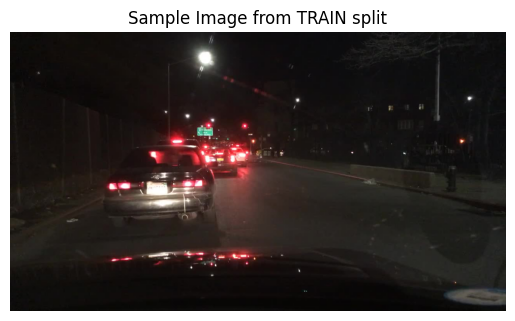


🔍 Exploring VAL split...
--------------------------------------------------
📸 Sample images in VAL: ['c80565a4-c813cdc0.jpg', 'c854d83c-ab3b375a.jpg', 'c7eddd1b-73993ae6.jpg', 'c7e9dd39-2e5a6648.jpg', 'c8650e15-38bef9dc.jpg']


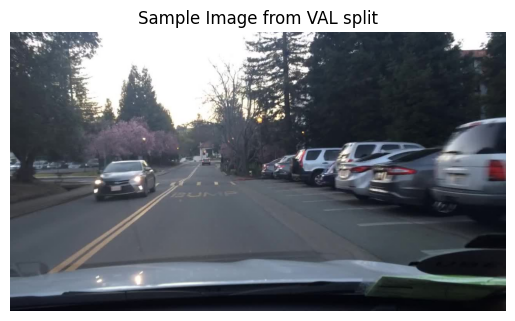


🔍 Exploring TEST split...
--------------------------------------------------
📸 Sample images in TEST: ['fb0acda4-fa59d3e0.jpg', 'fb6e05aa-49e2456e.jpg', 'fb12e7d8-d7ccf9d5.jpg', 'fb3645df-4d6e4550.jpg', 'fdaa1d2c-3b27ff78.jpg']


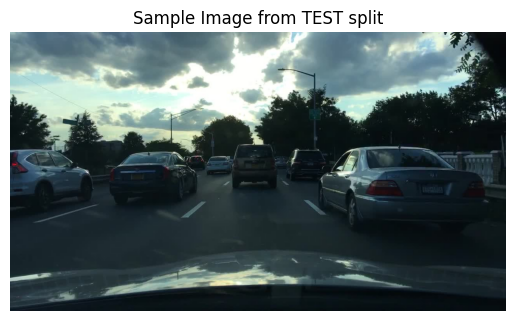

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Define base path to BDD100K in Google Drive
base_path = "/content/drive/MyDrive/bdd100k_dataset"

# Define dataset splits
splits = ["train", "val", "test"]

# Loop through each split
for split in splits:
    print(f"\n🔍 Exploring {split.upper()} split...\n" + "-" * 50)

    # Detect proper image folder path
    if split in ["train", "val"]:
        images_folder = os.path.join(base_path, split, "images")
    else:  # For test set (flat folder)
        images_folder = os.path.join(base_path, split)

    # Check existence
    if not os.path.exists(images_folder):
        print(f"⚠️ Folder not found: {images_folder}")
        continue

    # List .jpg files
    image_files = [f for f in os.listdir(images_folder) if f.endswith(".jpg")]
    if not image_files:
        print("⚠️ No image files found.")
        continue

    # Show sample filenames
    print(f"📸 Sample images in {split.upper()}: {image_files[:5]}")

    # Load and display the first image
    sample_path = os.path.join(images_folder, image_files[0])
    img = Image.open(sample_path)

    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Sample Image from {split.upper()} split")
    plt.show()


In [ ]:
import os

# ✅ Base path to your dataset in Google Drive
base_path = "/content/drive/MyDrive/bdd100k_dataset"

# ✅ Define paths for images
train_image_dir = os.path.join(base_path, "train", "images")
val_image_dir = os.path.join(base_path, "val", "images")
test_image_dir = os.path.join(base_path, "test")  # Test is flat (no 'images/' subfolder)

# ✅ Define paths for YOLO label output (only for train and val)
train_yolo_label_dir = os.path.join(base_path, "train", "yolo_labels")
val_yolo_label_dir = os.path.join(base_path, "val", "yolo_labels")

# ✅ Create YOLO label folders if they don't exist
os.makedirs(train_yolo_label_dir, exist_ok=True)
os.makedirs(val_yolo_label_dir, exist_ok=True)

# ✅ Display all paths
print("✅ Paths set correctly:")
print("Train Images Directory:", train_image_dir)
print("Train YOLO Labels Directory:", train_yolo_label_dir)
print("Val Images Directory:", val_image_dir)
print("Val YOLO Labels Directory:", val_yolo_label_dir)
print("Test Images Directory (no labels expected):", test_image_dir)



✅ Paths set correctly:
Train Images Directory: /content/drive/MyDrive/bdd100k_dataset/train/images
Train YOLO Labels Directory: /content/drive/MyDrive/bdd100k_dataset/train/yolo_labels
Val Images Directory: /content/drive/MyDrive/bdd100k_dataset/val/images
Val YOLO Labels Directory: /content/drive/MyDrive/bdd100k_dataset/val/yolo_labels
Test Images Directory (no labels expected): /content/drive/MyDrive/bdd100k_dataset/test


# **PHASE TWO: PRE_PROCESSING DATASET**

## **Step One: Convert BDD100K Annotations to COCO Format**

In [ ]:
import json
import os
from tqdm import tqdm
from pathlib import Path
from PIL import Image

# ✅ Base Drive Path
base_path = "/content/drive/MyDrive/bdd100k_dataset"

# ✅ Splits to convert
splits = ["val", "train"]

# ✅ BDD100K Category Mapping
category_names = ['bike', 'bus', 'car', 'motor', 'person', 'rider',
                  'traffic light', 'traffic sign', 'truck', 'train']
category_mapping = {name: idx + 1 for idx, name in enumerate(category_names)}

for split in splits:
    print(f"\n\U0001F501 Converting {split.upper()} split...")

    # Paths
    image_dir = os.path.join(base_path, split, "images")
    annotation_path = os.path.join(base_path, split, "annotations", f"bdd100k_labels_images_{split}.json")
    final_output_path = os.path.join(base_path, split, f"bdd_{split}_coco.json")
    temp_output_path = final_output_path.replace(".json", "_temp.json")
    progress_log_path = final_output_path.replace(".json", "_done.txt")
    backup_path = final_output_path.replace(".json", "_backup.json")

    # Load annotations
    with open(annotation_path, 'r') as f:
        bdd_annotations = json.load(f)

    # Load progress log
    done_images = set()
    if os.path.exists(progress_log_path):
        with open(progress_log_path, 'r') as f:
            done_images = set(line.strip() for line in f.readlines())

    # Load existing COCO output if resuming
    if os.path.exists(final_output_path):
        with open(final_output_path, 'r') as f:
            coco_output = json.load(f)
        existing_image_filenames = set(img['file_name'] for img in coco_output['images'])
        annotation_id = max([ann["id"] for ann in coco_output["annotations"]], default=0) + 1
        print(f"\U0001F501 Resuming from {len(existing_image_filenames)} images and {annotation_id - 1} annotations.")
    else:
        coco_output = {
            "images": [],
            "annotations": [],
            "categories": [
                {"id": idx + 1, "name": name, "supercategory": "object"}
                for idx, name in enumerate(category_names)
            ]
        }
        existing_image_filenames = set()
        annotation_id = 1

    for entry in tqdm(bdd_annotations, desc=f"Processing {split.upper()} split"):
        image_filename = entry["name"]

        if image_filename in done_images or image_filename in existing_image_filenames:
            continue

        image_path = os.path.join(image_dir, image_filename)
        if not os.path.exists(image_path):
            continue

        try:
            with Image.open(image_path) as img:
                width, height = img.size
        except:
            continue

        image_id = len(coco_output["images"]) + 1
        coco_output["images"].append({
            "id": image_id,
            "file_name": image_filename,
            "width": width,
            "height": height
        })

        for label in entry.get("labels", []):
            category = label["category"]
            if category not in category_mapping:
                continue
            box = label.get("box2d", None)
            if not box:
                continue

            x, y, w, h = box["x1"], box["y1"], box["x2"] - box["x1"], box["y2"] - box["y1"]

            coco_output["annotations"].append({
                "id": annotation_id,
                "image_id": image_id,
                "category_id": category_mapping[category],
                "bbox": [x, y, w, h],
                "area": w * h,
                "iscrowd": 0
            })
            annotation_id += 1

        with open(progress_log_path, "a") as log:
            log.write(image_filename + "\n")

        if image_id % 500 == 0:
            with open(temp_output_path, "w") as f:
                json.dump(coco_output, f)

    if os.path.exists(final_output_path):
        os.replace(final_output_path, backup_path)

    with open(final_output_path, "w") as f:
        json.dump(coco_output, f, indent=4)

    print(f"COCO file saved: {final_output_path}")
    print(f"Temporary file: {temp_output_path}")
    print(f"Backup saved: {backup_path}")
    print(f"Process log: {progress_log_path}")



🔁 Converting VAL split...
🔁 Resuming from 10000 images and 185526 annotations.


Processing VAL split: 100%|██████████| 10000/10000 [00:00<00:00, 1042011.33it/s]


COCO file saved: /content/drive/MyDrive/bdd100k_dataset/val/bdd_val_coco.json
Temporary file: /content/drive/MyDrive/bdd100k_dataset/val/bdd_val_coco_temp.json
Backup saved: /content/drive/MyDrive/bdd100k_dataset/val/bdd_val_coco_backup.json
Process log: /content/drive/MyDrive/bdd100k_dataset/val/bdd_val_coco_done.txt

🔁 Converting TRAIN split...
🔁 Resuming from 31888 images and 587971 annotations.


Processing TRAIN split: 100%|██████████| 69863/69863 [00:00<00:00, 1134790.20it/s]


COCO file saved: /content/drive/MyDrive/bdd100k_dataset/train/bdd_train_coco.json
Temporary file: /content/drive/MyDrive/bdd100k_dataset/train/bdd_train_coco_temp.json
Backup saved: /content/drive/MyDrive/bdd100k_dataset/train/bdd_train_coco_backup.json
Process log: /content/drive/MyDrive/bdd100k_dataset/train/bdd_train_coco_done.txt


# **Step Two: Convert BDD100K COCO format to YOLO format**

In [ ]:
import json
import os
from tqdm import tqdm
from pathlib import Path
from time import time

# ✅ Base paths and setup
base_path = "/content/drive/MyDrive/bdd100k_dataset"
splits = ["train", "val"]
label_ext = ".txt"

# ✅ Timer start
overall_start = time()

for split in splits:
    print(f"\n🔁 Converting {split.upper()} split to YOLO format...")

    # Paths
    coco_json_path = os.path.join(base_path, split, f"bdd_{split}_coco.json")
    yolo_output_dir = os.path.join(base_path, split, "yolo_labels")
    os.makedirs(yolo_output_dir, exist_ok=True)

    # Progress log
    progress_log = os.path.join(base_path, split, f"yolo_{split}_done.txt")
    processed = set()
    if os.path.exists(progress_log):
        with open(progress_log, 'r') as f:
            processed = set(line.strip() for line in f.readlines())

    # Load COCO
    with open(coco_json_path, "r") as f:
        coco_data = json.load(f)

    category_id_to_name = {cat["id"]: cat["name"] for cat in coco_data["categories"]}
    label_map = {name: idx for idx, name in enumerate(category_id_to_name.values())}
    image_info = {img["id"]: img for img in coco_data["images"]}

    # Group annotations
    image_to_annotations = {}
    for ann in coco_data["annotations"]:
        image_to_annotations.setdefault(ann["image_id"], []).append(ann)

    new_files = 0
    skipped = 0

    # Start timer for this split
    start_time = time()

    # Main conversion loop
    for image_id in tqdm(image_info, desc=f"📄 Processing {split.upper()} annotations"):
        img_data = image_info[image_id]
        image_name = img_data["file_name"]
        label_file = os.path.splitext(image_name)[0] + label_ext
        label_path = os.path.join(yolo_output_dir, label_file)

        # ✅ Skip if already processed
        if image_name in processed or os.path.exists(label_path):
            skipped += 1
            continue

        width, height = img_data["width"], img_data["height"]
        lines = []

        for ann in image_to_annotations.get(image_id, []):
            category_id = ann["category_id"]
            bbox = ann["bbox"]
            x, y, w, h = bbox

            x_center = (x + w / 2) / width
            y_center = (y + h / 2) / height
            box_w = w / width
            box_h = h / height

            class_id = label_map[category_id_to_name[category_id]]
            yolo_line = f"{class_id} {x_center:.6f} {y_center:.6f} {box_w:.6f} {box_h:.6f}"
            lines.append(yolo_line)

        if lines:
            with open(label_path, "w") as f:
                f.write("\n".join(lines))
            new_files += 1

            # ✅ Append progress
            with open(progress_log, "a") as f:
                f.write(image_name + "\n")

    # End timer
    elapsed = time() - start_time
    print(f"\n✅ {split.upper()} split conversion complete.")
    print(f"📂 YOLO labels saved to: {yolo_output_dir}")
    print(f"🕐 Time elapsed: {elapsed:.2f} seconds")
    print(f"✅ New files written: {new_files}, Skipped existing: {skipped}")

# Summary
print(f"\n✅ All conversions done in {time() - overall_start:.2f} seconds.")



🔁 Converting TRAIN split to YOLO format...


📄 Processing TRAIN annotations: 100%|██████████| 31888/31888 [00:03<00:00, 8698.28it/s]



✅ TRAIN split conversion complete.
📂 YOLO labels saved to: /content/drive/MyDrive/bdd100k_dataset/train/yolo_labels
🕐 Time elapsed: 3.67 seconds
✅ New files written: 0, Skipped existing: 31888

🔁 Converting VAL split to YOLO format...


📄 Processing VAL annotations: 100%|██████████| 10000/10000 [00:01<00:00, 7986.46it/s]


✅ VAL split conversion complete.
📂 YOLO labels saved to: /content/drive/MyDrive/bdd100k_dataset/val/yolo_labels
🕐 Time elapsed: 1.25 seconds
✅ New files written: 0, Skipped existing: 10000

✅ All conversions done in 9.79 seconds.


In [ ]:
# Final Label Mapping Summary
print("\n📌 Unified Label Mapping (Class ID → Name):")
for name, idx in label_map.items():
    print(f"  {idx}: {name}")


📌 Unified Label Mapping (Class ID → Name):
  0: bike
  1: bus
  2: car
  3: motor
  4: person
  5: rider
  6: traffic light
  7: traffic sign
  8: truck
  9: train


In [ ]:
!ls /content/drive/MyDrive/bdd100k_dataset/val/yolo_labels | head


b1c66a42-6f7d68ca.txt
b1c81faa-3df17267.txt
b1c81faa-c80764c5.txt
b1c9c847-3bda4659.txt
b1ca2e5d-84cf9134.txt
b1ca8418-84a133a0.txt
b1cac6a7-04e33135.txt
b1cd1e94-26dd524f.txt
b1cd1e94-549d0bfe.txt
b1ceb32e-3f481b43.txt


In [ ]:
!ls /content/drive/MyDrive/bdd100k_dataset/train/yolo_labels | head

60ae1f84-7f7febe6.txt
60b03f93-021c3d01.txt
60b03f93-5aab95d6.txt
60b1dd1e-3b98f07c.txt
60b1e4f3-05667801.txt
60b4f31b-1ffe08bb.txt
60b4f31b-5c26256b.txt
60b60f60-578c81d7.txt
60b68997-0e30f793.txt
60b68997-8a30ee5f.txt


# **Step Three:PyTorch Dataset for BDD100K in YOLO Format**

In [ ]:
from torchvision import transforms
from torch.utils.data import Dataset
from PIL import Image
import os
import torch

class BDD100K_YOLODataset(Dataset):
    def __init__(self, image_dir, label_dir, img_size=416, augment=False):
        self.image_dir = image_dir
        self.label_dir = label_dir
        self.img_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]
        self.img_size = img_size
        self.augment = augment

        # Basic + Augmentation transforms
        if augment:
            self.transform = transforms.Compose([
                transforms.Resize((img_size, img_size)),
                transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.02),
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.ToTensor(),
            ])
        else:
            self.transform = transforms.Compose([
                transforms.Resize((img_size, img_size)),
                transforms.ToTensor()
            ])

    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, idx):
        img_name = self.img_files[idx]
        img_path = os.path.join(self.image_dir, img_name)
        label_path = os.path.join(self.label_dir, os.path.splitext(img_name)[0] + '.txt')

        # Load and transform image
        img = Image.open(img_path).convert("RGB")
        img = self.transform(img)

        # Load labels
        if os.path.exists(label_path):
            boxes = []
            with open(label_path, 'r') as f:
                for line in f.readlines():
                    class_id, x_center, y_center, width, height = map(float, line.strip().split())
                    boxes.append([class_id, x_center, y_center, width, height])
            boxes = torch.tensor(boxes)
        else:
            boxes = torch.empty((0, 5))  # No annotations

        return img, boxes


In [ ]:
from torch.utils.data import DataLoader

# Set paths
base_path = "/content/drive/MyDrive/bdd100k_dataset"

train_dataset = BDD100K_YOLODataset(
    image_dir=os.path.join(base_path, "train", "images"),
    label_dir=os.path.join(base_path, "train", "yolo_labels"),
    augment=True  # ✅ Enable augmentation for training
)

val_dataset = BDD100K_YOLODataset(
    image_dir=os.path.join(base_path, "val", "images"),
    label_dir=os.path.join(base_path, "val", "yolo_labels"),
    augment=False  # ❌ No augmentation for validation
)

# Create DataLoaders with custom collate_fn
def collate_fn(batch):
    images, targets = zip(*batch)
    return torch.stack(images), list(targets)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, collate_fn=collate_fn)


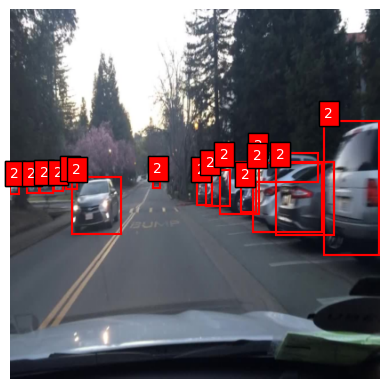

📦 Label tensor: tensor([[2.0000e+00, 1.1206e-02, 4.7976e-01, 9.3234e+00, 1.4625e+01],
        [2.0000e+00, 6.1304e-02, 4.7859e-01, 1.2614e+01, 1.3650e+01],
        [2.0000e+00, 9.7559e-02, 4.7742e-01, 1.5356e+01, 1.4625e+01],
        [2.0000e+00, 1.2920e-01, 4.7508e-01, 9.8717e+00, 1.2675e+01],
        [2.0000e+00, 1.6479e-01, 4.6805e-01, 1.2066e+01, 1.4625e+01],
        [2.0000e+00, 2.3269e-01, 5.2898e-01, 5.4295e+01, 6.3375e+01],
        [2.0000e+00, 3.9538e-01, 4.6570e-01, 7.3491e+00, 1.2675e+01],
        [2.0000e+00, 5.2431e-01, 4.9031e-01, 1.7002e+01, 3.1200e+01],
        [2.0000e+00, 5.6188e-01, 4.8211e-01, 2.7422e+01, 3.9975e+01],
        [2.0000e+00, 6.2002e-01, 4.8094e-01, 4.4423e+01, 5.8500e+01],
        [2.0000e+00, 6.4362e-01, 5.0672e-01, 1.6453e+01, 3.3150e+01],
        [2.0000e+00, 7.4553e-01, 4.2598e-01, 7.2942e+01, 3.2175e+01],
        [2.0000e+00, 7.4949e-01, 5.0801e-01, 7.8426e+01, 7.7025e+01],
        [2.0000e+00, 7.9695e-01, 5.1035e-01, 6.5264e+01, 8.2875e+01],
    

In [ ]:
# View sample from validation set (no augmentation)
import numpy as np
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image


def show_yolo_image_with_boxes(image_tensor, boxes):
    img = TF.to_pil_image(image_tensor)
    img_np = np.array(img)
    h, w = img_np.shape[:2]

    fig, ax = plt.subplots(1)
    ax.imshow(img_np)

    for box in boxes:
        class_id, x_center, y_center, bw, bh = box
        x = (x_center - bw / 2) * w
        y = (y_center - bh / 2) * h
        bw *= w
        bh *= h

        rect = patches.Rectangle((x, y), bw, bh, linewidth=1.5, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        ax.text(x, y - 4, f"{int(class_id)}", color='white', bbox=dict(facecolor='red'))

    plt.axis("off")
    plt.show()

# Preview first image from validation set
for images, labels in val_loader:
    show_yolo_image_with_boxes(images[0], labels[0])

    # Print raw label tensor for debugging
    print("📦 Label tensor:", labels[0])
    break


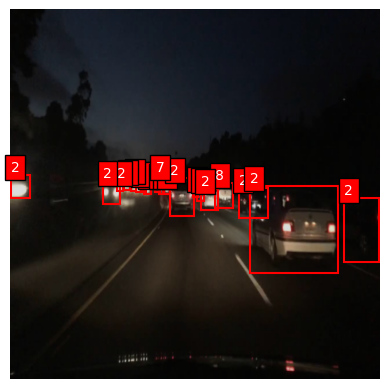

📦 Label tensor: tensor([[2.0000e+00, 3.6074e-01, 4.7815e-01, 5.1135e+00, 1.1111e+01],
        [2.0000e+00, 3.6961e-01, 4.8544e-01, 7.9543e+00, 1.1111e+01],
        [2.0000e+00, 3.4708e-01, 4.7937e-01, 5.1135e+00, 1.2121e+01],
        [2.0000e+00, 3.3342e-01, 4.7330e-01, 6.2500e+00, 1.3131e+01],
        [2.0000e+00, 3.1498e-01, 4.7330e-01, 6.8178e+00, 1.1111e+01],
        [2.0000e+00, 2.9655e-01, 4.7573e-01, 6.2500e+00, 1.1111e+01],
        [2.0000e+00, 2.7333e-01, 4.9394e-01, 1.8750e+01, 2.6262e+01],
        [2.0000e+00, 3.9761e-01, 4.8301e-01, 6.2500e+00, 9.0908e+00],
        [2.0000e+00, 4.0854e-01, 4.8544e-01, 6.2500e+00, 1.1111e+01],
        [2.0000e+00, 4.2220e-01, 4.8544e-01, 8.5226e+00, 1.1111e+01],
        [2.0000e+00, 5.0073e-01, 4.9272e-01, 5.6817e+00, 1.1111e+01],
        [2.0000e+00, 5.1371e-01, 5.0001e-01, 8.5226e+00, 1.5151e+01],
        [8.0000e+00, 5.7790e-01, 5.0244e-01, 1.9886e+01, 2.7272e+01],
        [2.0000e+00, 4.6454e-01, 5.0608e-01, 2.6704e+01, 4.2423e+01],
    

In [ ]:
# View one sample image and print its labels
for images, labels in train_loader:
    # Show image with bounding boxes
    show_yolo_image_with_boxes(images[0], labels[0])

    # Print raw label tensor for debugging
    print("📦 Label tensor:", labels[0])
    break



In [ ]:
import os

def check_dataset_structure(base_path="/content/drive/MyDrive/bdd100k_dataset"):
    splits = ["train", "val", "test"]
    split_summary = {}
    success = True

    for split in splits:
        # Test split has images directly in the folder (no 'images/' subfolder)
        img_dir = os.path.join(base_path, split, "images") if split != "test" else os.path.join(base_path, split)
        label_dir = os.path.join(base_path, split, "yolo_labels")

        print(f"\n📂 Checking {split.upper()} split...")

        # Image check
        if not os.path.isdir(img_dir):
            print(f"❌ Missing image directory: {img_dir}")
            img_count = 0
            success = False
        else:
            img_files = [f for f in os.listdir(img_dir) if f.endswith(".jpg")]
            img_count = len(img_files)
            print(f"✅ Found {img_count} image files")

        # Label check
        if split == "test":
            print("⚠️ Skipping label check for TEST split (no labels expected)")
            label_count = 0
        else:
            if not os.path.isdir(label_dir):
                print(f"❌ Missing label directory: {label_dir}")
                label_count = 0
                success = False
            else:
                label_files = [f for f in os.listdir(label_dir) if f.endswith(".txt")]
                label_count = len(label_files)
                print(f"✅ Found {label_count} label files")

        split_summary[split] = {
            "images": img_count,
            "labels": label_count
        }

    print("\n📊 Summary:")
    for split, stats in split_summary.items():
        print(f"  🔹 {split.upper()}: {stats['images']} images, {stats['labels']} labels")

    if success:
        print("\n✅ Dataset structure is valid and ready for training.")
    else:
        print("\n❗ Please fix the issues above before proceeding with training.")

    return split_summary

# Run the check
check_dataset_structure()



📂 Checking TRAIN split...
✅ Found 70000 image files
✅ Found 31888 label files

📂 Checking VAL split...
✅ Found 10000 image files
✅ Found 10000 label files

📂 Checking TEST split...
✅ Found 20000 image files
⚠️ Skipping label check for TEST split (no labels expected)

📊 Summary:
  🔹 TRAIN: 70000 images, 31888 labels
  🔹 VAL: 10000 images, 10000 labels
  🔹 TEST: 20000 images, 0 labels

✅ Dataset structure is valid and ready for training.


{'train': {'images': 70000, 'labels': 31888},
 'val': {'images': 10000, 'labels': 10000},
 'test': {'images': 20000, 'labels': 0}}

In [ ]:
def yolo_collate_fn(batch):
    """
    Custom collate function to handle varying number of labels (bounding boxes) per image.
    """
    images = []
    targets = []
    for img, target in batch:
        images.append(img)
        targets.append(target)  # each target is a [N, 5] tensor
    return torch.stack(images), targets  # targets is a list of tensors



In [ ]:
from torch.utils.data import DataLoader

# Paths
base_path = "/content/drive/MyDrive/bdd100k_dataset"
img_size = 416

train_dataset = BDD100K_YOLODataset(
    image_dir=os.path.join(base_path, "train", "images"),
    label_dir=os.path.join(base_path, "train", "yolo_labels"),
    img_size=img_size,
    augment=True
)

val_dataset = BDD100K_YOLODataset(
    image_dir=os.path.join(base_path, "val", "images"),
    label_dir=os.path.join(base_path, "val", "yolo_labels"),
    img_size=img_size,
    augment=False
)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, collate_fn=yolo_collate_fn)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, collate_fn=yolo_collate_fn)


In [ ]:
for imgs, labels in train_loader:
    print("🟩 Train batch loaded")
    print("Images:", imgs.shape)
    print("Labels: A list of", len(labels), "tensors with shape like:", labels[0].shape if labels else "No labels")
    break

for imgs, labels in val_loader:
    print("🟦 Val batch loaded")
    print("Images:", imgs.shape)
    print("Labels: A list of", len(labels), "tensors with shape like:", labels[0].shape if labels else "No labels")
    break


🟩 Train batch loaded
Images: torch.Size([16, 3, 416, 416])
Labels: A list of 16 tensors with shape like: torch.Size([0, 5])
🟦 Val batch loaded
Images: torch.Size([16, 3, 416, 416])
Labels: A list of 16 tensors with shape like: torch.Size([30, 5])


In [ ]:
import os
import random
import torch
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torchvision.transforms.functional as TF

# Class names for display
CLASS_NAMES = [
    'bike', 'bus', 'car', 'motor', 'person',
    'rider', 'traffic light', 'traffic sign', 'truck', 'train'
]

def show_yolo_image_with_boxes(image_tensor, boxes, class_names=None):
    img = TF.to_pil_image(image_tensor).convert("RGB")
    img = np.array(img)
    h, w = img.shape[:2]

    fig, ax = plt.subplots(1, figsize=(8, 8))
    ax.imshow(img)

    if boxes is not None and len(boxes) > 0:
        for box in boxes:
            class_id, x_center, y_center, bw, bh = box.tolist()

            x = (x_center - bw / 2) * w
            y = (y_center - bh / 2) * h
            bw_px = bw * w
            bh_px = bh * h

            rect = patches.Rectangle((x, y), bw_px, bh_px, linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)

            if class_names:
                ax.text(x, y - 5, class_names[int(class_id)], color='white',
                        fontsize=8, bbox=dict(facecolor='red', alpha=0.6))

    ax.axis("off")
    plt.show()

def visualize_random_sample_with_labels(split="train"):
    base_path = "/content/drive/MyDrive/bdd100k_dataset"
    image_dir = os.path.join(base_path, split, "images")
    label_dir = os.path.join(base_path, split, "yolo_labels")

    # List of non-empty label files
    label_files = [f for f in os.listdir(label_dir) if os.path.getsize(os.path.join(label_dir, f)) > 0]
    random_file = random.choice(label_files)

    # Get image path
    img_name = random_file.replace(".txt", ".jpg")
    img_path = os.path.join(image_dir, img_name)

    # Load image and label
    img = Image.open(img_path).convert("RGB")
    img_tensor = TF.to_tensor(img)

    with open(os.path.join(label_dir, random_file), 'r') as f:
        boxes = [list(map(float, line.strip().split())) for line in f.readlines()]
        boxes = torch.tensor(boxes)

    print(f"🔍 Showing sample: {img_name} from {split.upper()}")
    show_yolo_image_with_boxes(img_tensor, boxes, class_names=CLASS_NAMES)


🔍 Showing sample: 8e611959-0049c38c.jpg from TRAIN


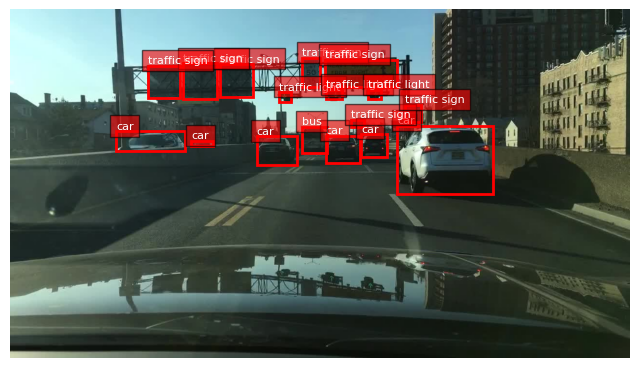

🔍 Showing sample: bfd32194-f4ea20e9.jpg from VAL


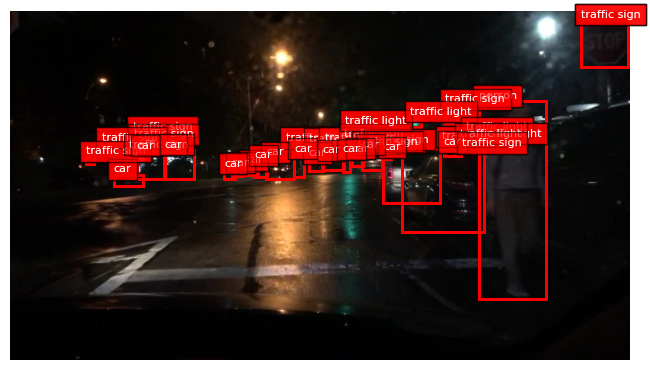

In [ ]:
# For training set
visualize_random_sample_with_labels("train")

# For validation set
visualize_random_sample_with_labels("val")


# **PHASE THREE: MODEL TRAINING**

# **FIRST METHOD: CNN-Based Model (Ultralytics- YOLOv8)**

# **Set Up Ultralytics YOLOv8 Environment**

In [ ]:
import os

# Target base path in Google Drive
target_base = "/content/drive/MyDrive/bdd100k_yolo"

# Subdirectories required for YOLOv8 format
subdirs = [
    "images/train",
    "images/val",
    "images/test",
    "labels/train",
    "labels/val",
    "labels/test"
]

# Create directories
for subdir in subdirs:
    full_path = os.path.join(target_base, subdir)
    os.makedirs(full_path, exist_ok=True)
    print(f"✅ Created: {full_path}")


✅ Created: /content/drive/MyDrive/bdd100k_yolo/images/train
✅ Created: /content/drive/MyDrive/bdd100k_yolo/images/val
✅ Created: /content/drive/MyDrive/bdd100k_yolo/images/test
✅ Created: /content/drive/MyDrive/bdd100k_yolo/labels/train
✅ Created: /content/drive/MyDrive/bdd100k_yolo/labels/val
✅ Created: /content/drive/MyDrive/bdd100k_yolo/labels/test


In [ ]:
import os
import shutil
from tqdm import tqdm

# Source and destination base paths
source_base = "/content/drive/MyDrive/bdd100k_dataset"
target_base = "/content/drive/MyDrive/bdd100k_yolo"

splits = ["train", "val", "test"]

for split in splits:
    print(f"\n🔁 Copying {split.upper()} data...")

    # Handle TEST split differently (images are directly in /test/)
    if split == "test":
        image_src = os.path.join(source_base, split)
        label_src = None  # no labels
    else:
        image_src = os.path.join(source_base, split, "images")
        label_src = os.path.join(source_base, split, "yolo_labels")

    # Destination folders (uniform)
    image_dst = os.path.join(target_base, "images", split)
    label_dst = os.path.join(target_base, "labels", split)
    os.makedirs(image_dst, exist_ok=True)
    if split != "test":
        os.makedirs(label_dst, exist_ok=True)

    # === IMAGES ===
    if os.path.exists(image_src):
        image_files = [f for f in os.listdir(image_src) if f.endswith(".jpg")]
        skipped_images, copied_images = 0, 0

        for f in tqdm(image_files, desc=f"🖼️ {split} images"):
            src_path = os.path.join(image_src, f)
            dst_path = os.path.join(image_dst, f)
            if os.path.exists(dst_path):
                skipped_images += 1
                continue
            shutil.copy2(src_path, dst_path)
            copied_images += 1
        print(f"✅ Copied {copied_images} new images, skipped {skipped_images}.")
    else:
        print(f"❌ Image source folder not found: {image_src}")

    # === LABELS (only for train and val) ===
    if split != "test" and os.path.exists(label_src):
        label_files = [f for f in os.listdir(label_src) if f.endswith(".txt")]
        skipped_labels, copied_labels = 0, 0

        for f in tqdm(label_files, desc=f"🏷️ {split} labels"):
            src_path = os.path.join(label_src, f)
            dst_path = os.path.join(label_dst, f)
            if os.path.exists(dst_path):
                skipped_labels += 1
                continue
            shutil.copy2(src_path, dst_path)
            copied_labels += 1
        print(f"✅ Copied {copied_labels} new labels, skipped {skipped_labels}.")
    elif split == "test":
        print("⚠️ Skipping label copy for TEST split (no annotations expected).")

print("\n✅ All splits processed. Only new files were copied.")



🔁 Copying TRAIN data...


🖼️ train images: 100%|██████████| 70000/70000 [04:09<00:00, 281.03it/s] 


✅ Copied 1 new images, skipped 69999.


🏷️ train labels: 100%|██████████| 31888/31888 [00:04<00:00, 7961.04it/s]


✅ Copied 0 new labels, skipped 31888.

🔁 Copying VAL data...


🖼️ val images: 100%|██████████| 10000/10000 [00:01<00:00, 8615.28it/s]


✅ Copied 0 new images, skipped 10000.


🏷️ val labels: 100%|██████████| 10000/10000 [00:01<00:00, 8115.05it/s]


✅ Copied 0 new labels, skipped 10000.

🔁 Copying TEST data...


🖼️ test images: 100%|██████████| 20000/20000 [00:04<00:00, 4487.66it/s]

✅ Copied 0 new images, skipped 20000.
⚠️ Skipping label copy for TEST split (no annotations expected).

✅ All splits processed. Only new files were copied.


In [ ]:
# Check if there are orphan label files
image_dir = "/content/drive/MyDrive/bdd100k_yolo/images/train"
label_dir = "/content/drive/MyDrive/bdd100k_yolo/labels/train"

image_basenames = set(os.path.splitext(f)[0] for f in os.listdir(image_dir) if f.endswith(".jpg"))
label_basenames = set(os.path.splitext(f)[0] for f in os.listdir(label_dir) if f.endswith(".txt"))

# True orphan check
orphans = label_basenames - image_basenames

print(f"🔍 Orphan label files without corresponding images: {len(orphans)}")
if orphans:
    print("📝 Sample orphans:", list(orphans)[:5])


🔍 Orphan label files without corresponding images: 0


In [ ]:
unlabeled_images = image_basenames - label_basenames
print(f"📂 Images without label files: {len(unlabeled_images)}")


📂 Images without label files: 38112


In [ ]:
import os
from tqdm import tqdm

# Set your directories
image_dir = "/content/drive/MyDrive/bdd100k_yolo/images/train"
label_dir = "/content/drive/MyDrive/bdd100k_yolo/labels/train"

# List all base filenames
image_files = set(os.path.splitext(f)[0] for f in os.listdir(image_dir) if f.endswith(".jpg"))
label_files = set(os.path.splitext(f)[0] for f in os.listdir(label_dir) if f.endswith(".txt"))

# Find images that don't have a corresponding label
unlabeled_images = image_files - label_files
print(f"🧹 Found {len(unlabeled_images)} unlabeled images to delete.")

deleted = 0
for name in tqdm(unlabeled_images, desc="🗑️ Deleting"):
    img_path = os.path.join(image_dir, name + ".jpg")
    if os.path.exists(img_path):
        os.remove(img_path)
        deleted += 1

print(f"\n✅ Deleted {deleted} unlabeled images.")


🧹 Found 38112 unlabeled images to delete.


🗑️ Deleting: 100%|██████████| 38112/38112 [01:03<00:00, 600.89it/s]


✅ Deleted 38112 unlabeled images.


In [ ]:
import yaml
import os

# Paths
data_yaml_path = "/content/drive/MyDrive/bdd100k_yolo/data.yaml"
train_dir = "/content/drive/MyDrive/bdd100k_yolo/images/train"
val_dir = "/content/drive/MyDrive/bdd100k_yolo/images/val"

# Class names from BDD100K
class_names = [
    "bike", "bus", "car", "motor", "person",
    "rider", "traffic light", "traffic sign", "truck", "train"
]

# Prepare YAML content
data_dict = {
    'train': train_dir,
    'val': val_dir,
    'nc': len(class_names),
    'names': class_names
}

# Save YAML file
os.makedirs(os.path.dirname(data_yaml_path), exist_ok=True)
with open(data_yaml_path, 'w') as f:
    yaml.dump(data_dict, f, default_flow_style=False)

print(f"✅ data.yaml created at: {data_yaml_path}")


✅ data.yaml created at: /content/drive/MyDrive/bdd100k_yolo/data.yaml


# **First: Train Model with Nano Version (start with Epochs=5 then increase to 50 Epochs)**

In [ ]:
# STEP 1: Install Ultralytics (YOLOv8)
!pip install ultralytics --upgrade --quiet

# STEP 2: Import YOLO
from ultralytics import YOLO

# STEP 3: Define model and training parameters
model = YOLO("yolov8n.yaml")  # or use 'yolov8s.yaml', 'yolov8m.yaml', 'yolov8l.yaml', 'yolov8x.yaml'

# Path to your data.yaml file
data_yaml = "/content/drive/MyDrive/bdd100k_yolo/data.yaml"

# STEP 4: Start training
model.train(
    data=data_yaml,
    epochs=5,
    imgsz=320,
    batch=16,
    name="bdd100k_yolov8n0",
    workers=6,
    amp=True,
    device=0,
    project="/content/drive/MyDrive/yolo_training_runs",
    exist_ok=True  # 🔁 Overwrites previous run folder with the same name

)



Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/bdd100k_yolo/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.yaml, momentum=0.937, mosaic=1.0, multi_scale=False, name=bdd100k_yolov8n6, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=T

train: Scanning /content/drive/MyDrive/bdd100k_yolo/labels/train... 31888 images, 0 backgrounds, 0 corrupt: 100%|██████████| 31888/31888 [1:21:00<00:00,  6.56it/s]

train: /content/drive/MyDrive/bdd100k_yolo/images/train/75055858-7d04a650.jpg: 1 duplicate labels removed


train: New cache created: /content/drive/MyDrive/bdd100k_yolo/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.5±0.3 ms, read: 0.1±0.0 MB/s, size: 58.6 KB)


val: Scanning /content/drive/MyDrive/bdd100k_yolo/labels/val... 10000 images, 12 backgrounds, 0 corrupt: 100%|██████████| 10012/10012 [29:43<00:00,  5.61it/s]

val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1c66a42-6f7d68ca.jpg: 68 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1c81faa-3df17267.jpg: 8 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1c81faa-c80764c5.jpg: 28 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1c9c847-3bda4659.jpg: 38 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1ca2e5d-84cf9134.jpg: 70 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1ca8418-84a133a0.jpg: 12 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1cac6a7-04e33135.jpg: 32 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1cd1e94-26dd524f.jpg: 38 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1cd1e94-549d0bfe.jpg: 26 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1ceb32e-3f481b43.jpg:

val: New cache created: /content/drive/MyDrive/bdd100k_yolo/labels/val.cache
Plotting labels to /content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8n6/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 320 train, 320 val
Using 6 dataloader workers
Logging results to /content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8n6
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5     0.988G      3.617      2.995      2.587        460        320: 100%|██████████| 1993/1993 [03:26<00:00,  9.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:50<00:00,  6.15it/s]


                   all      10012     185526      0.615     0.0241      0.024    0.00949

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5         1G      2.359      1.666      1.409        508        320: 100%|██████████| 1993/1993 [03:11<00:00, 10.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:50<00:00,  6.24it/s]


                   all      10012     185526      0.419     0.0617     0.0499     0.0231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.02G      2.075      1.436      1.251        454        320: 100%|██████████| 1993/1993 [03:05<00:00, 10.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:50<00:00,  6.17it/s]


                   all      10012     185526      0.286     0.0839     0.0645     0.0319

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.04G      1.924      1.308      1.187        460        320: 100%|██████████| 1993/1993 [03:04<00:00, 10.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:49<00:00,  6.27it/s]


                   all      10012     185526      0.398     0.0948     0.0749     0.0381

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.06G      1.835      1.236      1.151        550        320: 100%|██████████| 1993/1993 [03:04<00:00, 10.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:49<00:00,  6.27it/s]


                   all      10012     185526      0.378      0.101     0.0816     0.0424

5 epochs completed in 0.338 hours.
Optimizer stripped from /content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8n6/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8n6/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8n6/weights/best.pt...
Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:55<00:00,  5.66it/s]


                   all      10012     185526      0.378      0.101     0.0816     0.0424
                  bike        578       1007          1          0     0.0086    0.00193
                   bus       1242       1597      0.233       0.19      0.116     0.0736
                   car       9879     102506      0.349      0.429      0.388      0.209
                 motor        334        452          1          0     0.0172    0.00491
                person       3220      13262      0.186     0.0983      0.055     0.0165
                 rider        515        649      0.231     0.0077     0.0186    0.00612
         traffic light       5653      26885      0.245     0.0287     0.0234     0.0064
          traffic sign       8221      34908      0.231     0.0538      0.039     0.0144
                 truck       2689       4245      0.308      0.205      0.151     0.0915
                 train         14         15          0          0          0          0
Speed: 0.1ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b70dfa28ad0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0

# ***Increase number of Epochs without start from begining***

In [ ]:
# ✅ STEP 1: Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# ✅ STEP 2: Install Ultralytics
!pip install ultralytics --quiet

# ✅ STEP 3: Import required packages
import os
import torch
from ultralytics import YOLO
import yaml

# ✅ STEP 4: Set paths
project_name = "bdd100k_yolov8n"
resume_run = f"/content/drive/MyDrive/yolo_training_runs/{project_name}"
weights_path = os.path.join(resume_run, "weights", "best.pt")
data_yaml_path = "/content/drive/MyDrive/bdd100k_yolo/data.yaml"

# ✅ STEP 5: Safely update data.yaml if needed
train_img_path = "/content/drive/MyDrive/bdd100k_yolo/images/train_labeled_only"
val_img_path = "/content/drive/MyDrive/bdd100k_yolo/images/val"
train_lbl_path = "/content/drive/MyDrive/bdd100k_yolo/labels/train_labeled_only"
val_lbl_path = "/content/drive/MyDrive/bdd100k_yolo/labels/val"

new_data_yaml = {
    "path": "/content/drive/MyDrive/bdd100k_yolo",
    "train": train_img_path,
    "val": val_img_path,
    "test": "",  # You can add test path later
    "names": ['bike', 'bus', 'car', 'motor', 'person', 'rider', 'traffic light', 'traffic sign', 'truck', 'train'],
    "nc": 10
}

with open(data_yaml_path, 'w') as f:
    yaml.dump(new_data_yaml, f)
print(f"✅ data.yaml updated at: {data_yaml_path}")

# ✅ STEP 6: Resume training
model = YOLO(weights_path)
model.train(
    data=data_yaml_path,
    epochs=50,  # Total target epoch count
    imgsz=320,
    batch=16,
    name=project_name,
    project="/content/drive/MyDrive/yolo_training_runs",
    workers=6,
    device=0 if torch.cuda.is_available() else 'cpu',
    amp=True,
    exist_ok=True  # 🔁 Keep same folder/logs
)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ data.yaml updated at: /content/drive/MyDrive/bdd100k_yolo/data.yaml
Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/bdd100k_yolo/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/cont

train: Scanning /content/drive/MyDrive/bdd100k_yolo/labels/train_labeled_only... 465 images, 2 backgrounds, 0 corrupt: 100%|██████████| 465/465 [01:00<00:00,  7.64it/s]

train: New cache created: /content/drive/MyDrive/bdd100k_yolo/labels/train_labeled_only.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.7±0.2 ms, read: 0.1±0.0 MB/s, size: 58.6 KB)


val: Scanning /content/drive/MyDrive/bdd100k_yolo/labels/val.cache... 10000 images, 12 backgrounds, 0 corrupt: 100%|██████████| 10012/10012 [00:00<?, ?it/s]

val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1c66a42-6f7d68ca.jpg: 68 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1c81faa-3df17267.jpg: 8 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1c81faa-c80764c5.jpg: 28 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1c9c847-3bda4659.jpg: 38 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1ca2e5d-84cf9134.jpg: 70 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1ca8418-84a133a0.jpg: 12 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1cac6a7-04e33135.jpg: 32 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1cd1e94-26dd524f.jpg: 38 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1cd1e94-549d0bfe.jpg: 26 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1ceb32e-3f481b43.jpg:

Plotting labels to /content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8n7/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 320 train, 320 val
Using 6 dataloader workers
Logging results to /content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8n7
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50     0.746G      1.326     0.8034     0.9525         27        320: 100%|██████████| 30/30 [00:06<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [04:22<00:00,  1.19it/s]


                   all      10012     185526      0.348      0.214      0.196      0.106

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50     0.912G      1.387     0.8462     0.9672         11        320: 100%|██████████| 30/30 [00:02<00:00, 10.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.49it/s]


                   all      10012     185526      0.339      0.214      0.192      0.103

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50     0.912G       1.35      0.832     0.9472         22        320: 100%|██████████| 30/30 [00:02<00:00, 11.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.51it/s]


                   all      10012     185526      0.341      0.207      0.187      0.101

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      0.93G      1.355     0.8407     0.9521         33        320: 100%|██████████| 30/30 [00:02<00:00, 11.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.46it/s]


                   all      10012     185526      0.346      0.207      0.186     0.0993

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      0.93G      1.367     0.8351     0.9554         40        320: 100%|██████████| 30/30 [00:02<00:00, 11.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.49it/s]


                   all      10012     185526       0.33      0.209      0.184      0.098

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      0.93G      1.347     0.8276     0.9505         38        320: 100%|██████████| 30/30 [00:02<00:00, 11.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.49it/s]


                   all      10012     185526       0.33      0.203      0.179      0.096

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      0.93G      1.332     0.8278     0.9555         40        320: 100%|██████████| 30/30 [00:02<00:00, 11.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.52it/s]


                   all      10012     185526      0.328      0.206      0.182     0.0979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      0.93G      1.328     0.8204     0.9545         11        320: 100%|██████████| 30/30 [00:02<00:00, 11.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.47it/s]


                   all      10012     185526      0.319      0.206      0.184     0.0977

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      0.93G      1.326     0.8356     0.9532         22        320: 100%|██████████| 30/30 [00:02<00:00, 11.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.41it/s]


                   all      10012     185526      0.328      0.203      0.182     0.0974

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      0.93G      1.355     0.8411     0.9537         34        320: 100%|██████████| 30/30 [00:02<00:00, 11.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.45it/s]


                   all      10012     185526      0.313      0.208      0.178     0.0955

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      0.93G      1.325     0.8131     0.9504         35        320: 100%|██████████| 30/30 [00:02<00:00, 10.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.56it/s]


                   all      10012     185526      0.319      0.205       0.18     0.0959

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50     0.986G      1.333     0.8155     0.9447         43        320: 100%|██████████| 30/30 [00:02<00:00, 11.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.54it/s]


                   all      10012     185526      0.313      0.206       0.18     0.0959

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50     0.986G      1.311     0.7995     0.9395         38        320: 100%|██████████| 30/30 [00:02<00:00, 11.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.51it/s]


                   all      10012     185526      0.313      0.204      0.181     0.0968

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50     0.986G      1.295     0.7999     0.9478         16        320: 100%|██████████| 30/30 [00:02<00:00, 11.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.56it/s]


                   all      10012     185526      0.301      0.208      0.177     0.0938

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50     0.986G       1.32     0.8137     0.9421         13        320: 100%|██████████| 30/30 [00:02<00:00, 11.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.53it/s]


                   all      10012     185526       0.32      0.201      0.177     0.0939

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50     0.986G      1.344     0.8245     0.9495         31        320: 100%|██████████| 30/30 [00:02<00:00, 11.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.54it/s]


                   all      10012     185526      0.301      0.206      0.178     0.0956

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50     0.986G      1.326     0.8224     0.9379         34        320: 100%|██████████| 30/30 [00:02<00:00, 11.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.50it/s]


                   all      10012     185526      0.309      0.203      0.177     0.0952

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50     0.986G      1.335     0.8184      0.939         71        320: 100%|██████████| 30/30 [00:02<00:00, 11.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.54it/s]


                   all      10012     185526      0.313        0.2      0.178     0.0957

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50     0.986G      1.291     0.7908     0.9421         15        320: 100%|██████████| 30/30 [00:02<00:00, 11.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.55it/s]


                   all      10012     185526       0.31      0.203      0.177     0.0955

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50     0.986G       1.35     0.8169     0.9544         46        320: 100%|██████████| 30/30 [00:02<00:00, 11.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.60it/s]


                   all      10012     185526       0.31      0.202      0.178     0.0957

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50     0.986G      1.326     0.8203     0.9372         22        320: 100%|██████████| 30/30 [00:02<00:00, 11.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.54it/s]


                   all      10012     185526      0.319      0.204       0.18     0.0962

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50     0.986G      1.318     0.7712     0.9433         57        320: 100%|██████████| 30/30 [00:02<00:00, 11.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.55it/s]


                   all      10012     185526      0.307      0.204      0.176     0.0937

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50     0.986G      1.313     0.7766     0.9342         22        320: 100%|██████████| 30/30 [00:02<00:00, 11.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.48it/s]


                   all      10012     185526      0.303      0.205      0.175     0.0934

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50     0.986G      1.277     0.7786     0.9388         15        320: 100%|██████████| 30/30 [00:02<00:00, 10.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.53it/s]


                   all      10012     185526      0.313      0.199      0.175     0.0939

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      1.05G      1.319     0.8042     0.9409         23        320: 100%|██████████| 30/30 [00:02<00:00, 11.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.54it/s]


                   all      10012     185526      0.305      0.204      0.176     0.0948

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      1.05G      1.314     0.8011      0.959         11        320: 100%|██████████| 30/30 [00:02<00:00, 11.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.60it/s]


                   all      10012     185526        0.3      0.205      0.176     0.0941

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      1.05G      1.326     0.7959     0.9424         66        320: 100%|██████████| 30/30 [00:02<00:00, 11.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.58it/s]


                   all      10012     185526      0.309      0.205      0.178      0.095

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      1.05G      1.313     0.7907     0.9365         13        320: 100%|██████████| 30/30 [00:02<00:00, 11.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.54it/s]


                   all      10012     185526      0.307      0.206      0.177      0.094

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      1.05G      1.276     0.7536     0.9311         40        320: 100%|██████████| 30/30 [00:02<00:00, 11.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.50it/s]


                   all      10012     185526       0.31      0.205      0.178     0.0954

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      1.07G      1.295     0.7797     0.9418         34        320: 100%|██████████| 30/30 [00:02<00:00, 11.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.53it/s]


                   all      10012     185526      0.317      0.201      0.178     0.0955

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      1.07G      1.287     0.7756       0.93         58        320: 100%|██████████| 30/30 [00:02<00:00, 11.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.51it/s]


                   all      10012     185526      0.324      0.198      0.177     0.0946

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      1.07G      1.259     0.7665     0.9372          5        320: 100%|██████████| 30/30 [00:02<00:00, 11.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.54it/s]


                   all      10012     185526      0.319        0.2      0.179     0.0957

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      1.07G      1.281     0.7668     0.9309         19        320: 100%|██████████| 30/30 [00:02<00:00, 11.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.56it/s]


                   all      10012     185526      0.303      0.204      0.177     0.0947

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      1.07G        1.3     0.7962     0.9473         49        320: 100%|██████████| 30/30 [00:02<00:00, 11.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.51it/s]


                   all      10012     185526      0.324      0.201      0.179     0.0963

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      1.07G      1.281     0.7708     0.9405         13        320: 100%|██████████| 30/30 [00:02<00:00, 11.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.64it/s]


                   all      10012     185526      0.315      0.202      0.179     0.0962

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      1.07G      1.298     0.7733     0.9446         21        320: 100%|██████████| 30/30 [00:02<00:00, 11.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.62it/s]


                   all      10012     185526      0.314      0.203      0.179      0.096

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      1.07G      1.285     0.7582     0.9289         21        320: 100%|██████████| 30/30 [00:02<00:00, 11.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.58it/s]


                   all      10012     185526      0.315      0.203      0.178     0.0956

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      1.07G      1.303     0.7712     0.9349         17        320: 100%|██████████| 30/30 [00:02<00:00, 11.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.59it/s]


                   all      10012     185526      0.324        0.2      0.177     0.0944

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      1.07G      1.304     0.7874     0.9343         37        320: 100%|██████████| 30/30 [00:02<00:00, 11.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.39it/s]


                   all      10012     185526      0.319        0.2      0.177     0.0951

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      1.07G      1.287     0.7866     0.9288          8        320: 100%|██████████| 30/30 [00:02<00:00, 11.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.49it/s]


                   all      10012     185526       0.31      0.204      0.177     0.0952
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      1.07G      1.309     0.7736     0.9226         12        320: 100%|██████████| 30/30 [00:03<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.45it/s]


                   all      10012     185526      0.313      0.201      0.174      0.093

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      1.07G      1.295     0.7506     0.9327         12        320: 100%|██████████| 30/30 [00:02<00:00, 11.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.61it/s]


                   all      10012     185526      0.304      0.201      0.173     0.0924

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      1.07G      1.309       0.74     0.9357         17        320: 100%|██████████| 30/30 [00:02<00:00, 11.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.49it/s]


                   all      10012     185526        0.3      0.201      0.174      0.092

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      1.07G      1.282     0.7403     0.9298         20        320: 100%|██████████| 30/30 [00:02<00:00, 11.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.52it/s]


                   all      10012     185526      0.306      0.201      0.174     0.0921

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      1.07G       1.32     0.7865     0.9403         11        320: 100%|██████████| 30/30 [00:02<00:00, 11.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.60it/s]


                   all      10012     185526      0.307        0.2      0.174     0.0929

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      1.07G      1.289     0.7336     0.9279          5        320: 100%|██████████| 30/30 [00:02<00:00, 11.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.52it/s]


                   all      10012     185526      0.306        0.2      0.173     0.0924

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      1.07G      1.296     0.7526     0.9264         13        320: 100%|██████████| 30/30 [00:02<00:00, 11.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.54it/s]


                   all      10012     185526      0.303      0.199      0.173     0.0922

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      1.07G      1.278     0.7337     0.9252         24        320: 100%|██████████| 30/30 [00:02<00:00, 11.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.57it/s]


                   all      10012     185526      0.298      0.202      0.173     0.0924

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      1.07G      1.293     0.7336     0.9269         11        320: 100%|██████████| 30/30 [00:02<00:00, 12.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.60it/s]


                   all      10012     185526      0.301      0.202      0.174     0.0926

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      1.07G      1.302     0.7394     0.9377         18        320: 100%|██████████| 30/30 [00:02<00:00, 11.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:47<00:00,  6.58it/s]


                   all      10012     185526      0.301      0.202      0.174     0.0928

50 epochs completed in 0.790 hours.
Optimizer stripped from /content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8n7/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8n7/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8n7/weights/best.pt...
Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:52<00:00,  5.94it/s]


                   all      10012     185526      0.348      0.214      0.196      0.106
                  bike        578       1007      0.264     0.0775      0.073     0.0254
                   bus       1242       1597      0.363      0.358      0.298      0.218
                   car       9879     102506      0.539      0.528       0.53      0.317
                 motor        334        452      0.334     0.0844     0.0844     0.0364
                person       3220      13262      0.304       0.27      0.209     0.0771
                 rider        515        649      0.404      0.114       0.11     0.0383
         traffic light       5653      26885      0.416      0.148      0.135     0.0404
          traffic sign       8221      34908      0.458      0.187      0.188     0.0822
                 truck       2689       4245      0.393      0.375      0.334      0.224
                 train         14         15          0          0          0          0
Speed: 0.0ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78fa36355ad0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0

# **Second: Train Model with Large Version**


In [ ]:
# ✅ STEP 1: Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# ✅ STEP 2: Install Ultralytics
!pip install ultralytics --quiet

# ✅ STEP 3: Import required packages
import os
import torch
from ultralytics import YOLO
import yaml

# ✅ STEP 4: Set paths
project_name = "bdd100k_yolov8l"
output_root = "/content/drive/MyDrive/yolo_training_runs"
project_path = os.path.join(output_root, project_name)
data_yaml_path = "/content/drive/MyDrive/bdd100k_yolo/data.yaml"

# ✅ STEP 5: Create output folders if not exist
os.makedirs(project_path, exist_ok=True)

# ✅ STEP 6: Define dataset paths
train_img_path = "/content/drive/MyDrive/bdd100k_yolo/images/train_labeled_only"
val_img_path = "/content/drive/MyDrive/bdd100k_yolo/images/val"
train_lbl_path = "/content/drive/MyDrive/bdd100k_yolo/labels/train_labeled_only"
val_lbl_path = "/content/drive/MyDrive/bdd100k_yolo/labels/val"

# ✅ STEP 7: Create data.yaml
new_data_yaml = {
    "path": "/content/drive/MyDrive/bdd100k_yolo",
    "train": train_img_path,
    "val": val_img_path,
    "test": "",  # Optional
    "names": ['bike', 'bus', 'car', 'motor', 'person', 'rider', 'traffic light', 'traffic sign', 'truck', 'train'],
    "nc": 10
}

with open(data_yaml_path, 'w') as f:
    yaml.dump(new_data_yaml, f)
print(f"✅ data.yaml updated at: {data_yaml_path}")

# ✅ STEP 8: Start training from YOLOv8 Large pretrained weights
model = YOLO("yolov8l.pt")  # Using base large model from Ultralytics

model.train(
    data=data_yaml_path,
    epochs=50,
    imgsz=320,
    batch=16,
    name=project_name,
    project=output_root,
    workers=6,
    device=0 if torch.cuda.is_available() else 'cpu',
    amp=True,
    exist_ok=True
)


Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 29.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 104.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 96.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 47.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 43.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 79.3 MB/s eta 0:00:00
Creating new Ultra

Ultralytics 8.3.176 🚀 Python-3.11.13 torch-2.6.0+cu124 CPU (AMD EPYC 7B12)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/bdd100k_yolo/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8l.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=bdd100k_yolov8l, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose

Overriding model.yaml nc=80 with nc=10

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  3    279808  ultralytics.nn.modules.block.C2f             [128, 128, 3, True]           
  3                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  4                  -1  6   2101248  ultralytics.nn.modules.block.C2f             [256, 256, 6, True]           
  5                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256, 512, 3, 2]              
  6                  -1  6   8396800  ultralytics.nn.modules.block.C2f             [512, 512, 6, True]           
  7                  -1  1   2360320  ultralytic

  8                  -1  3   4461568  ultralytics.nn.modules.block.C2f             [512, 512, 3, True]           
  9                  -1  1    656896  ultralytics.nn.modules.block.SPPF            [512, 512, 5]                 
 10                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 11             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 12                  -1  3   4723712  ultralytics.nn.modules.block.C2f             [1024, 512, 3]                
 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 14             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 15                  -1  3   1247744  ultralytics.nn.modules.block.C2f             [768, 256, 3]                 
 16                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256,

train: Scanning /content/drive/MyDrive/bdd100k_yolo/labels/train_labeled_only.cache... 465 images, 2 backgrounds, 0 corrupt: 100%|██████████| 465/465 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 90.8±123.7 ms, read: 0.1±0.0 MB/s, size: 58.6 KB)


val: Scanning /content/drive/MyDrive/bdd100k_yolo/labels/val.cache... 10000 images, 12 backgrounds, 0 corrupt: 100%|██████████| 10012/10012 [00:00<?, ?it/s]

val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1c66a42-6f7d68ca.jpg: 68 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1c81faa-3df17267.jpg: 8 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1c81faa-c80764c5.jpg: 28 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1c9c847-3bda4659.jpg: 38 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1ca2e5d-84cf9134.jpg: 70 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1ca8418-84a133a0.jpg: 12 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1cac6a7-04e33135.jpg: 32 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1cd1e94-26dd524f.jpg: 38 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1cd1e94-549d0bfe.jpg: 26 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1ceb32e-3f481b43.jpg:

Plotting labels to /content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8l/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
Image sizes 320 train, 320 val
Using 0 dataloader workers
Logging results to /content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8l
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G      1.449      1.892      1.057         30        320: 100%|██████████| 30/30 [05:12<00:00, 10.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [3:48:58<00:00, 43.89s/it]


                   all      10012     185526       0.13      0.119      0.068     0.0368

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50         0G      1.523      1.161      1.087         12        320: 100%|██████████| 30/30 [05:03<00:00, 10.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [26:02<00:00,  4.99s/it]


                   all      10012     185526     0.0733     0.0929     0.0343     0.0169

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50         0G      1.477      1.082      1.059         54        320: 100%|██████████| 30/30 [05:00<00:00, 10.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [25:40<00:00,  4.92s/it]


                   all      10012     185526      0.201      0.123     0.0464     0.0207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50         0G      1.522      1.108       1.08         38        320: 100%|██████████| 30/30 [05:00<00:00, 10.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [25:35<00:00,  4.91s/it]


                   all      10012     185526      0.414      0.111     0.0817     0.0396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50         0G      1.523      1.067      1.085          6        320: 100%|██████████| 30/30 [05:03<00:00, 10.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [25:47<00:00,  4.94s/it]


                   all      10012     185526      0.242      0.126     0.0571     0.0257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50         0G       1.49      1.037      1.067         55        320: 100%|██████████| 30/30 [05:01<00:00, 10.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [25:28<00:00,  4.88s/it]


                   all      10012     185526      0.317      0.116     0.0951     0.0455

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50         0G      1.511      1.037      1.084          8        320: 100%|██████████| 30/30 [05:02<00:00, 10.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [26:00<00:00,  4.98s/it]


                   all      10012     185526      0.473      0.127      0.107     0.0522

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50         0G      1.522      1.023      1.078         19        320: 100%|██████████| 30/30 [05:01<00:00, 10.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [25:42<00:00,  4.93s/it]


                   all      10012     185526      0.302      0.115     0.0915     0.0459

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50         0G      1.445     0.9815      1.047         41        320: 100%|██████████| 30/30 [04:58<00:00,  9.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [25:28<00:00,  4.88s/it]


                   all      10012     185526      0.305      0.137       0.11     0.0547

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50         0G      1.441     0.9772      1.041         13        320: 100%|██████████| 30/30 [04:54<00:00,  9.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [25:27<00:00,  4.88s/it]


                   all      10012     185526      0.516      0.136      0.117     0.0577

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50         0G      1.438     0.9546      1.027         41        320: 100%|██████████| 30/30 [04:53<00:00,  9.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [25:14<00:00,  4.84s/it]


                   all      10012     185526      0.312       0.15      0.119     0.0599

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50         0G      1.412      0.903      1.046         12        320: 100%|██████████| 30/30 [04:54<00:00,  9.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [25:06<00:00,  4.81s/it]


                   all      10012     185526       0.22      0.162      0.114     0.0557

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50         0G       1.38      1.006      1.006          5        320: 100%|██████████| 30/30 [04:54<00:00,  9.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [25:03<00:00,  4.80s/it]


                   all      10012     185526      0.249      0.152      0.121     0.0609

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50         0G      1.362     0.9208      1.006         13        320: 100%|██████████| 30/30 [04:55<00:00,  9.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [25:00<00:00,  4.80s/it]


                   all      10012     185526      0.253      0.165      0.118     0.0581

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50         0G      1.389      0.868     0.9958         30        320: 100%|██████████| 30/30 [04:52<00:00,  9.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [24:50<00:00,  4.76s/it]


                   all      10012     185526      0.271      0.157      0.126     0.0624

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50         0G      1.365     0.9376     0.9922          1        320: 100%|██████████| 30/30 [04:45<00:00,  9.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [24:42<00:00,  4.74s/it]


                   all      10012     185526      0.266      0.156      0.134     0.0665

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50         0G      1.315     0.8154     0.9898         39        320: 100%|██████████| 30/30 [04:53<00:00,  9.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [24:49<00:00,  4.76s/it]


                   all      10012     185526      0.253      0.165      0.134     0.0669

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50         0G      1.345      0.826     0.9889         44        320: 100%|██████████| 30/30 [04:36<00:00,  9.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [23:42<00:00,  4.55s/it]


                   all      10012     185526      0.294      0.174      0.143     0.0722

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50         0G      1.302     0.7996     0.9805         24        320: 100%|██████████| 30/30 [04:36<00:00,  9.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [23:31<00:00,  4.51s/it]


                   all      10012     185526      0.309      0.159      0.142     0.0718

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50         0G      1.286     0.7964     0.9769         60        320: 100%|██████████| 30/30 [04:46<00:00,  9.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [24:01<00:00,  4.60s/it]


                   all      10012     185526      0.272      0.164      0.138     0.0695

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50         0G      1.261     0.7998     0.9723         28        320: 100%|██████████| 30/30 [04:41<00:00,  9.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [23:46<00:00,  4.56s/it]


                   all      10012     185526      0.274      0.171      0.143     0.0724

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50         0G      1.278      0.789     0.9783         22        320: 100%|██████████| 30/30 [04:38<00:00,  9.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [22:13<00:00,  4.26s/it]


                   all      10012     185526      0.282      0.179      0.149     0.0744

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50         0G      1.256     0.7419      0.963         36        320: 100%|██████████| 30/30 [04:11<00:00,  8.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [20:50<00:00,  3.99s/it]


                   all      10012     185526      0.274      0.178       0.15     0.0759

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50         0G      1.231     0.7341     0.9646         14        320: 100%|██████████| 30/30 [04:12<00:00,  8.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [20:48<00:00,  3.99s/it]


                   all      10012     185526       0.29      0.182      0.152     0.0773

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50         0G      1.201      0.734     0.9568         27        320: 100%|██████████| 30/30 [04:07<00:00,  8.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [20:22<00:00,  3.90s/it]


                   all      10012     185526      0.286      0.192      0.155     0.0793

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50         0G      1.183     0.7048     0.9382         15        320: 100%|██████████| 30/30 [04:06<00:00,  8.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [20:20<00:00,  3.90s/it]


                   all      10012     185526      0.328      0.161      0.152     0.0772

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50         0G      1.193     0.6992     0.9492         32        320: 100%|██████████| 30/30 [04:05<00:00,  8.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [20:30<00:00,  3.93s/it]


                   all      10012     185526      0.303      0.183      0.157     0.0808

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50         0G      1.197     0.7086      0.954         19        320: 100%|██████████| 30/30 [04:05<00:00,  8.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [20:19<00:00,  3.90s/it]


                   all      10012     185526      0.298      0.187      0.155     0.0786

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50         0G      1.177     0.6884     0.9364         51        320: 100%|██████████| 30/30 [04:04<00:00,  8.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [20:22<00:00,  3.91s/it]


                   all      10012     185526      0.279      0.174      0.151     0.0756

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50         0G      1.164     0.6642     0.9325         57        320: 100%|██████████| 30/30 [04:04<00:00,  8.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [20:14<00:00,  3.88s/it]


                   all      10012     185526      0.284      0.189      0.158     0.0802

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50         0G      1.162     0.6585     0.9329         38        320: 100%|██████████| 30/30 [04:05<00:00,  8.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [20:26<00:00,  3.92s/it]


                   all      10012     185526      0.291      0.189       0.16      0.082

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50         0G       1.16     0.6634     0.9327         18        320: 100%|██████████| 30/30 [04:04<00:00,  8.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  60%|█████▉    | 187/313 [12:03<08:08,  3.88s/it]

In [ ]:
# ✅ Mount Drive
from google.colab import drive
drive.mount('/content/drive')

# ✅ Install Ultralytics
!pip install -q ultralytics

# ✅ Imports
import os, torch, yaml
from ultralytics import YOLO

# === Paths ===
project_name   = "bdd100k_yolov8l"   # same name you used before
runs_root      = "/content/drive/MyDrive/yolo_training_runs"
run_dir        = os.path.join(runs_root, project_name)
last_ckpt      = os.path.join(run_dir, "weights", "last.pt")
data_yaml_path = "/content/drive/MyDrive/bdd100k_yolo/data.yaml"

# (optional) ensure data.yaml points to your labeled-only train split
new_data_yaml = {
    "path": "/content/drive/MyDrive/bdd100k_yolo",
    "train": "/content/drive/MyDrive/bdd100k_yolo/images/train_labeled_only",
    "val":   "/content/drive/MyDrive/bdd100k_yolo/images/val",
    "names": ['bike','bus','car','motor','person','rider','traffic light','traffic sign','truck','train'],
    "nc": 10
}
os.makedirs(os.path.dirname(data_yaml_path), exist_ok=True)
with open(data_yaml_path, "w") as f:
    yaml.dump(new_data_yaml, f)

# === Load model (resume if last.pt exists, otherwise start from yolov8l.pt) ===
if os.path.exists(last_ckpt):
    print("🔁 Resuming from:", last_ckpt)
    model = YOLO(last_ckpt)
    resume_flag = True
else:
    print("🆕 Starting fresh from yolov8l.pt")
    model = YOLO("yolov8l.pt")
    resume_flag = False

# === Train (will continue counting towards epochs=50 total when resume=True) ===
model.train(
    data=data_yaml_path,
    epochs=50,                 # total target epochs; resume continues from where you left off
    imgsz=320,
    batch=16,
    project=runs_root,
    name=project_name,
    workers=6,
    device=0 if torch.cuda.is_available() else 'cpu',
    amp=True,
    resume=resume_flag,        # <-- key: continues from last.pt
    save_period=5,             # extra safety: also save checkpoint every 5 epochs
    cache=True,                # speed up dataloading on re-runs
    exist_ok=True
)


Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 128.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 93.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 56.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 46.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 21.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 98.4 MB/s eta 0:00:00
Creating new Ultra


                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  3    279808  ultralytics.nn.modules.block.C2f             [128, 128, 3, True]           
  3                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  4                  -1  6   2101248  ultralytics.nn.modules.block.C2f             [256, 256, 6, True]           
  5                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256, 512, 3, 2]              
  6                  -1  6   8396800  ultralytics.nn.modules.block.C2f             [512, 512, 6, True]           
  7                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512

train: Scanning /content/drive/MyDrive/bdd100k_yolo/labels/train_labeled_only.cache... 465 images, 2 backgrounds, 0 corrupt: 100%|██████████| 465/465 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 148.4±83.9 ms, read: 0.1±0.1 MB/s, size: 58.6 KB)


val: Scanning /content/drive/MyDrive/bdd100k_yolo/labels/val.cache... 10000 images, 12 backgrounds, 0 corrupt: 100%|██████████| 10012/10012 [00:00<?, ?it/s]

val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1c66a42-6f7d68ca.jpg: 68 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1c81faa-3df17267.jpg: 8 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1c81faa-c80764c5.jpg: 28 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1c9c847-3bda4659.jpg: 38 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1ca2e5d-84cf9134.jpg: 70 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1ca8418-84a133a0.jpg: 12 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1cac6a7-04e33135.jpg: 32 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1cd1e94-26dd524f.jpg: 38 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1cd1e94-549d0bfe.jpg: 26 duplicate labels removed
val: /content/drive/MyDrive/bdd100k_yolo/images/val/b1ceb32e-3f481b43.jpg:

Plotting labels to /content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8l/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
Resuming training /content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8l/weights/last.pt from epoch 50 to 50 total epochs
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
Image sizes 320 train, 320 val
Using 0 dataloader workers
Logging results to /content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8l
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50         0G      1.054     0.5408     0.9061         25        320: 100%|██████████| 30/30 [04:13<00:00,  8.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [2:32:15<00:00, 29.19s/it]


                   all      10012     185526      0.335      0.204      0.181     0.0929

1 epochs completed in 2.609 hours.
Optimizer stripped from /content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8l/weights/last.pt, 87.6MB
Optimizer stripped from /content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8l/weights/best.pt, 87.6MB

Validating /content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8l/weights/best.pt...
Ultralytics 8.3.177 🚀 Python-3.11.13 torch-2.6.0+cu124 CPU (AMD EPYC 7B12)
Model summary (fused): 112 layers, 43,614,318 parameters, 0 gradients, 164.9 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   2%|▏         | 5/313 [00:20<20:29,  3.99s/it]

# **Step Four: Preformance Valuation**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


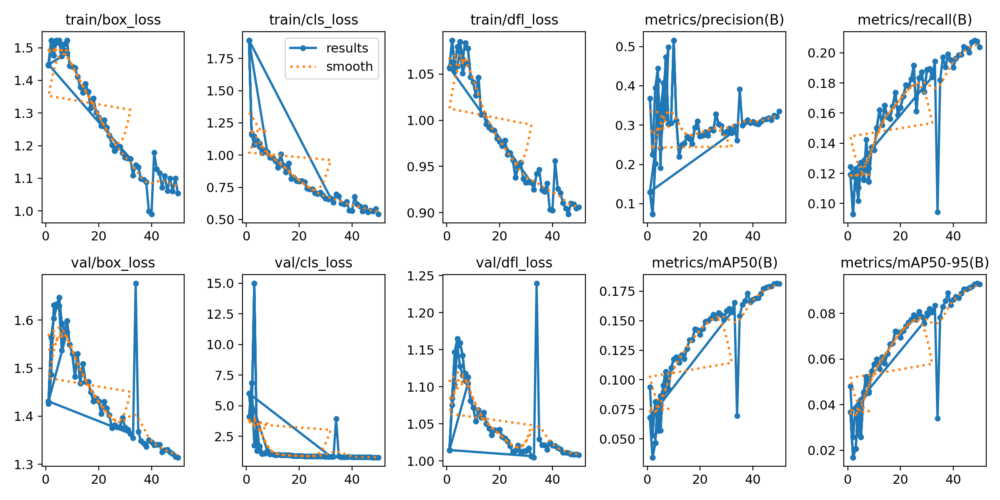

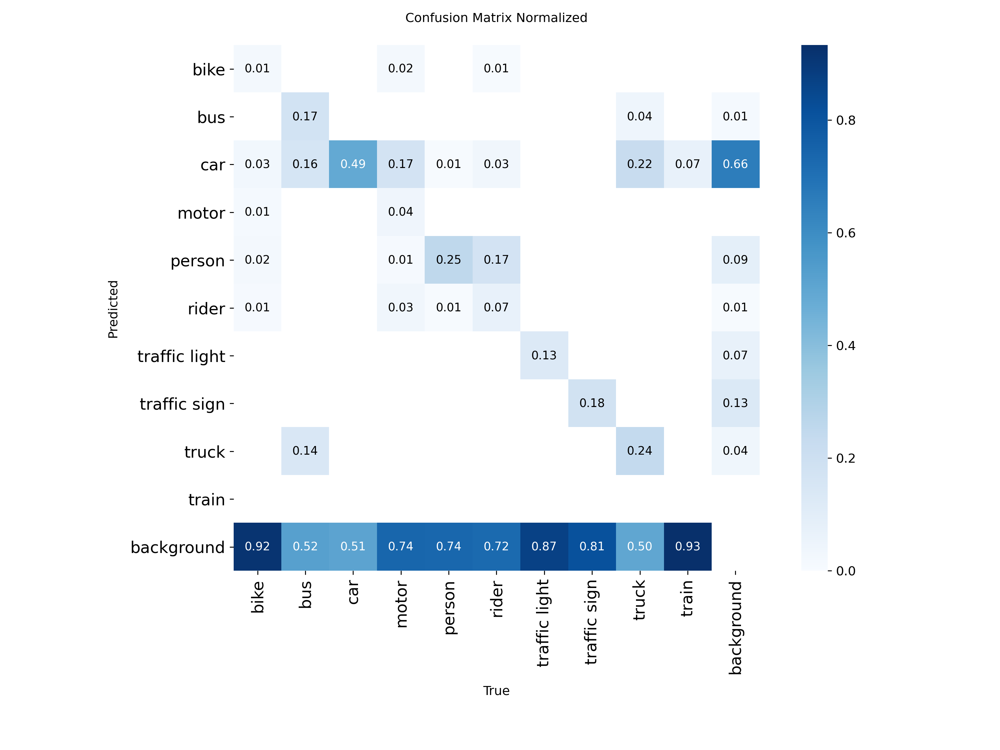

In [ ]:
# ✅ Mount Drive
from google.colab import drive
drive.mount('/content/drive')

from IPython.display import Image, display
import os

training_dir = "/content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8l"

# Show training metrics
display(Image(filename=os.path.join(training_dir, "results.png")))

# Optional: show confusion matrix if multi-class
conf_matrix = os.path.join(training_dir, "confusion_matrix_normalized.png")
if os.path.exists(conf_matrix):
    display(Image(filename=conf_matrix))


In [ ]:
import pandas as pd

results_csv = os.path.join(training_dir, "results.csv")
if os.path.exists(results_csv):
    df = pd.read_csv(results_csv)
    print("🔍 Metrics from training:")
    print(df.tail(3))  # Show last 3 epochs

🔍 Metrics from training:
    epoch      time  train/box_loss  train/cls_loss  train/dfl_loss  \
87     48  28316.60         1.06086         0.56334         0.90930   
88     49  29855.40         1.10035         0.58344         0.90452   
89     50   9391.32         1.05412         0.54083         0.90614   

    metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
87               0.32474            0.20833           0.18127   
88               0.32161            0.20768           0.18160   
89               0.33516            0.20366           0.18111   

    metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0  \
87              0.09281       1.32185       0.78849       1.00882  0.000050   
88              0.09319       1.31581       0.78584       1.00899  0.000035   
89              0.09287       1.31435       0.78273       1.00825  0.000021   

      lr/pg1    lr/pg2  
87  0.000050  0.000050  
88  0.000035  0.000035  
89  0.000021  0.000021  


In [ ]:
df[["metrics/precision(B)", "metrics/recall(B)", "metrics/mAP50(B)", "metrics/mAP50-95(B)"]].tail(1)


,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B)
89,0.33516,0.20366,0.18111,0.09287


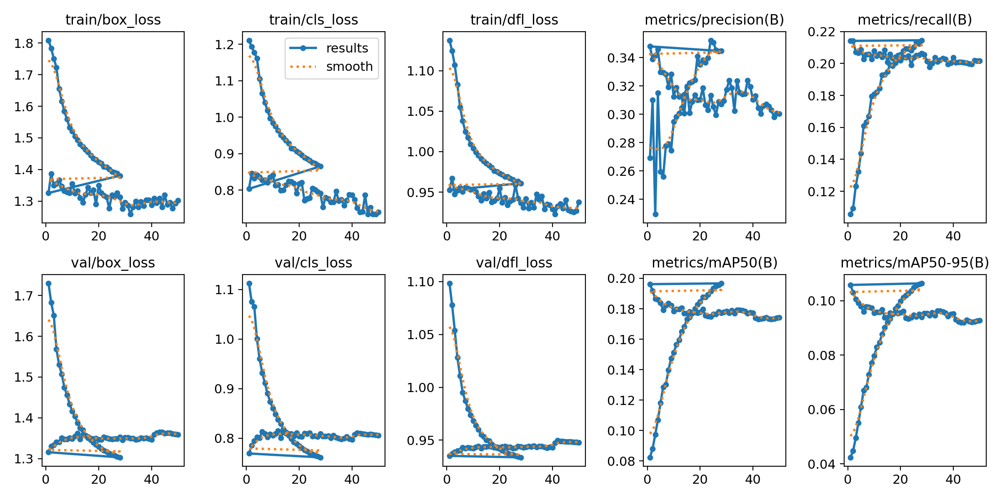

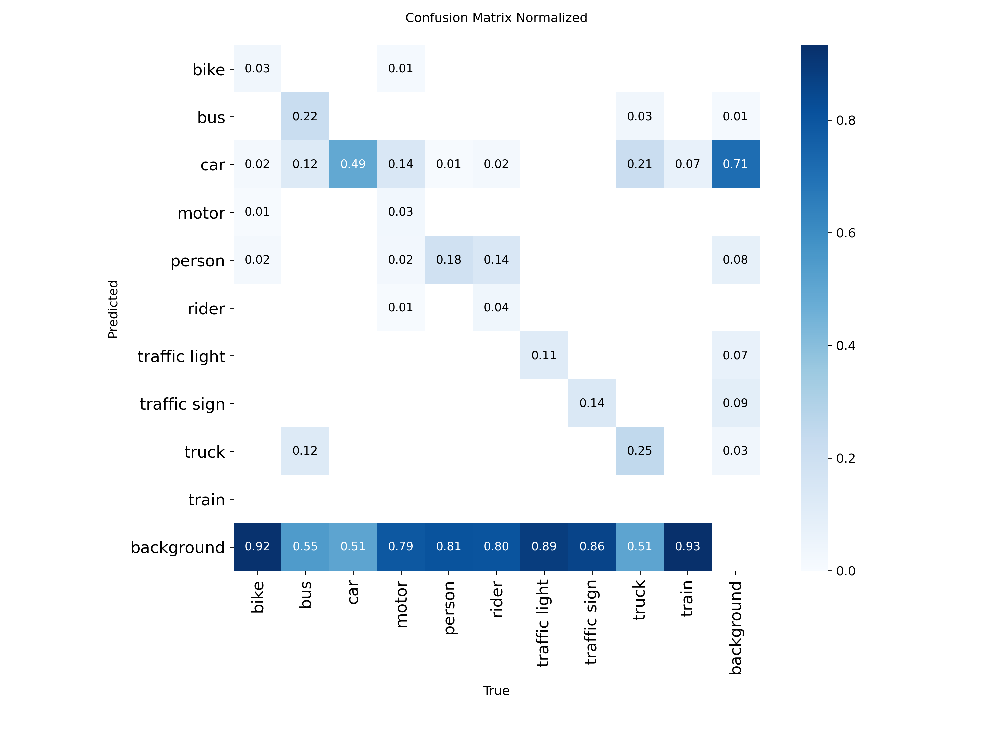

In [ ]:
from IPython.display import Image, display
import os

training_dir = "/content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8n"

# Show training metrics
display(Image(filename=os.path.join(training_dir, "results.png")))

# Optional: show confusion matrix if multi-class
conf_matrix = os.path.join(training_dir, "confusion_matrix_normalized.png")
if os.path.exists(conf_matrix):
    display(Image(filename=conf_matrix))


In [ ]:
import pandas as pd

results_csv = os.path.join(training_dir, "results.csv")
if os.path.exists(results_csv):
    df = pd.read_csv(results_csv)
    print("🔍 Metrics from training:")
    print(df.tail(3))  # Show last 3 epochs


🔍 Metrics from training:
    epoch     time  train/box_loss  train/cls_loss  train/dfl_loss  \
75     48  2740.76         1.27764         0.73367         0.92524   
76     49  2792.57         1.29338         0.73360         0.92691   
77     50  2844.60         1.30198         0.73936         0.93769   

    metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
75               0.29800            0.20198           0.17334   
76               0.30074            0.20175           0.17386   
77               0.30054            0.20167           0.17418   

    metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0  \
75              0.09235       1.36131       0.80716       0.94814  0.000050   
76              0.09262       1.35988       0.80649       0.94799  0.000035   
77              0.09282       1.35891       0.80579       0.94783  0.000021   

      lr/pg1    lr/pg2  
75  0.000050  0.000050  
76  0.000035  0.000035  
77  0.000021  0.000021  


In [ ]:
df[["metrics/precision(B)", "metrics/recall(B)", "metrics/mAP50(B)", "metrics/mAP50-95(B)"]].tail(1)


,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B)
77,0.30054,0.20167,0.17418,0.09282


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8n/weights/best.pt")
val_dir = "/content/drive/MyDrive/bdd100k_yolo/images/val"

model.predict(
    source=val_dir,
    save=True,
    conf=0.3,
    imgsz=320,
    project="/content/drive/MyDrive/yolo_val_preview",
    name="val_preds",
    device="cuda"  # or "cpu"
)


Streaming output truncated to the last 5000 lines.
image 5015/10012 /content/drive/MyDrive/bdd100k_yolo/images/val/be769e9f-ed37df2b.jpg: 192x320 13 cars, 6.8ms
image 5016/10012 /content/drive/MyDrive/bdd100k_yolo/images/val/be76ea62-78b2c8f8.jpg: 192x320 1 car, 7.1ms
image 5017/10012 /content/drive/MyDrive/bdd100k_yolo/images/val/be776742-fe6599b2.jpg: 192x320 19 cars, 6.7ms
image 5018/10012 /content/drive/MyDrive/bdd100k_yolo/images/val/be777044-7db298a4.jpg: 192x320 13 cars, 1 person, 6.9ms
image 5019/10012 /content/drive/MyDrive/bdd100k_yolo/images/val/be777044-db29e596.jpg: 192x320 9 cars, 1 truck, 7.8ms
image 5020/10012 /content/drive/MyDrive/bdd100k_yolo/images/val/be7783b0-b44ff154.jpg: 192x320 2 cars, 7.3ms
image 5021/10012 /content/drive/MyDrive/bdd100k_yolo/images/val/be791a81-a6b53fef.jpg: 192x320 1 car, 1 traffic sign, 7.9ms
image 5022/10012 /content/drive/MyDrive/bdd100k_yolo/images/val/be7b856e-d1ece683.jpg: 192x320 2 cars, 1 traffic sign, 7.1ms
image 5023/10012 /content

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'bike', 1: 'bus', 2: 'car', 3: 'motor', 4: 'person', 5: 'rider', 6: 'traffic light', 7: 'traffic sign', 8: 'truck', 9: 'train'}
 obb: None
 orig_img: array([[[255, 255, 225],
         [255, 255, 220],
         [255, 253, 218],
         ...,
         [ 56,  88, 123],
         [ 53,  85, 120],
         [ 51,  83, 118]],
 
        [[251, 249, 214],
         [254, 252, 217],
         [255, 254, 220],
         ...,
         [ 55,  87, 122],
         [ 52,  84, 119],
         [ 50,  82, 117]],
 
        [[223, 220, 189],
         [240, 237, 206],
         [251, 248, 217],
         ...,
         [ 54,  86, 121],
         [ 51,  83, 118],
         [ 49,  81, 116]],
 
        ...,
 
        [[ 48,  57,  60],
         [ 48,  57,  60],
         [ 48,  57,  60],
         ...,
         [ 27,  22,  19],
         [ 27,  22,  19],
         [ 27,  22,  

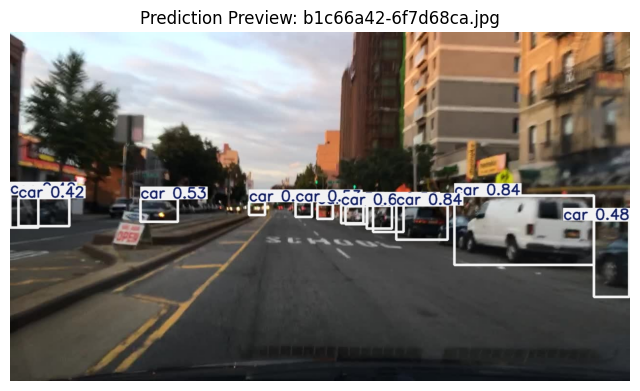

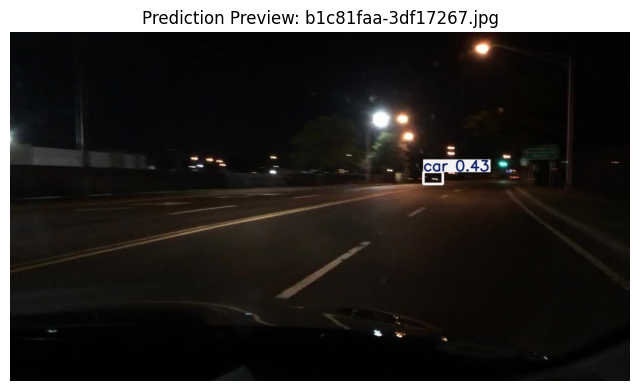

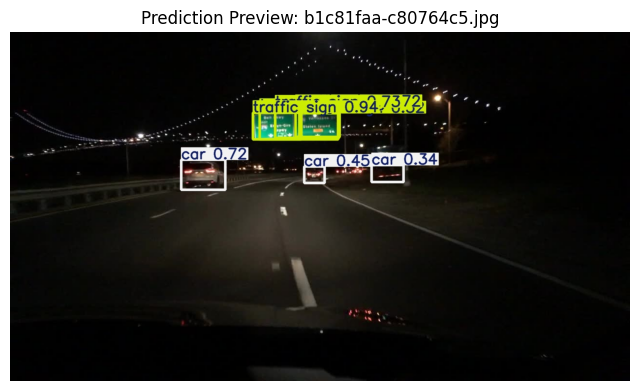

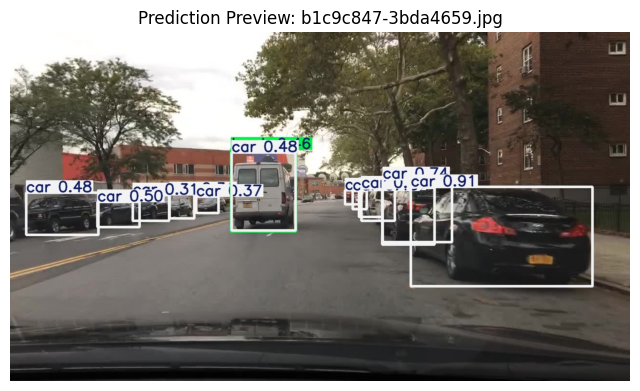

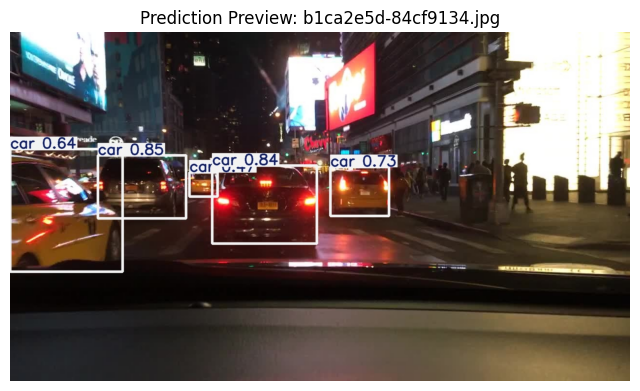

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Path where YOLO saved predicted images
pred_dir = "/content/drive/MyDrive/yolo_val_preview/val_preds"

# List all predicted image files
pred_images = sorted([f for f in os.listdir(pred_dir) if f.endswith((".jpg", ".png"))])

# Show a few predictions (change range as needed)
for i in range(5):  # Show first 5 predicted images
    img_path = os.path.join(pred_dir, pred_images[i])
    img = Image.open(img_path)

    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Prediction Preview: {pred_images[i]}")
    plt.show()


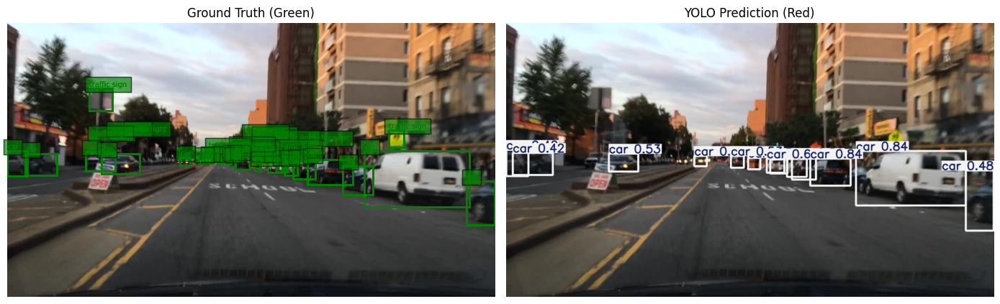

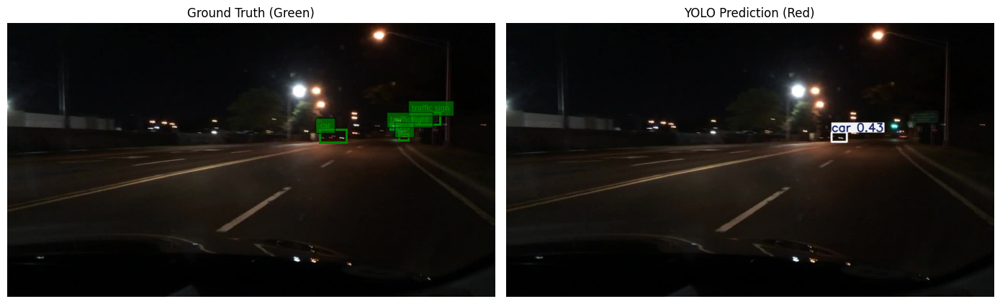

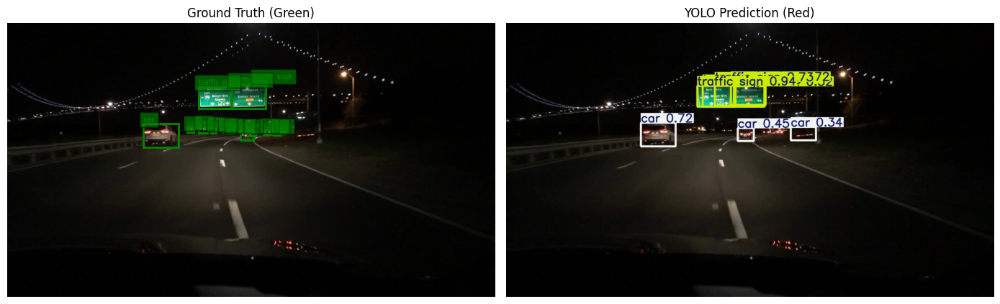

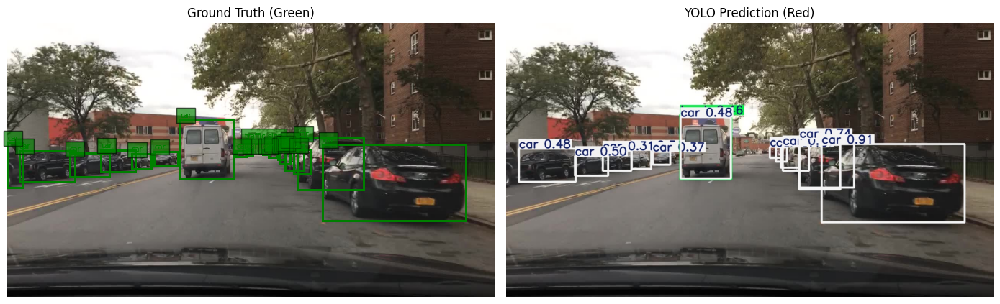

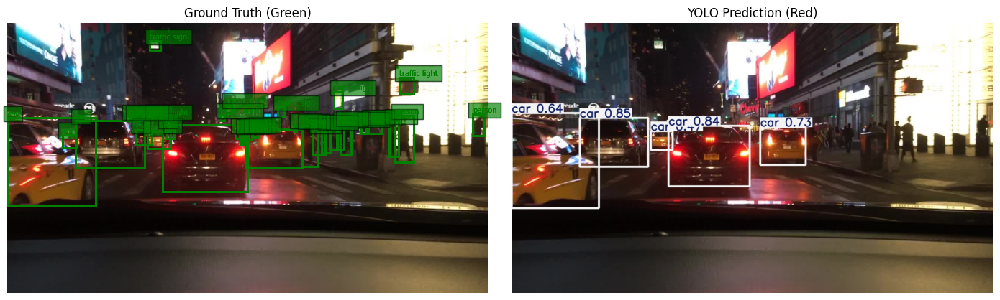

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np

# Paths
img_dir = "/content/drive/MyDrive/bdd100k_yolo/images/val"
label_dir = "/content/drive/MyDrive/bdd100k_yolo/labels/val"
pred_img_dir = "/content/drive/MyDrive/yolo_val_preview/val_preds"

# Class labels (optional)
class_names = ['bike', 'bus', 'car', 'motor', 'person', 'rider',
               'traffic light', 'traffic sign', 'truck', 'train']

# Helper to draw boxes
def draw_boxes(ax, boxes, w, h, color, label=''):
    for box in boxes:
        class_id, x_center, y_center, bw, bh = box
        x = (x_center - bw / 2) * w
        y = (y_center - bh / 2) * h
        bw_px = bw * w
        bh_px = bh * h
        rect = patches.Rectangle((x, y), bw_px, bh_px, linewidth=2,
                                 edgecolor=color, facecolor='none')
        ax.add_patch(rect)
        if class_names:
            ax.text(x, y - 5, class_names[int(class_id)], color=color,
                    fontsize=7, bbox=dict(facecolor=color, alpha=0.3))

# List predicted images
pred_images = sorted([f for f in os.listdir(pred_img_dir) if f.endswith(".jpg")])

# Visualize the first 5 comparisons
for img_file in pred_images[:5]:
    img_path = os.path.join(img_dir, img_file)
    label_path = os.path.join(label_dir, img_file.replace(".jpg", ".txt"))
    pred_img_path = os.path.join(pred_img_dir, img_file)

    # Open image
    img = Image.open(img_path).convert("RGB")
    w, h = img.size

    # Load GT boxes
    gt_boxes = []
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                gt_boxes.append(list(map(float, line.strip().split())))

    # Load predicted image (YOLO saves rendered predictions)
    pred_img = Image.open(pred_img_path)

    # Plot side by side
    fig, axs = plt.subplots(1, 2, figsize=(14, 6))

    # Left: Ground Truth
    axs[0].imshow(img)
    axs[0].set_title("Ground Truth (Green)")
    draw_boxes(axs[0], gt_boxes, w, h, color='green')
    axs[0].axis("off")

    # Right: Predicted
    axs[1].imshow(pred_img)
    axs[1].set_title("YOLO Prediction (Red)")
    axs[1].axis("off")

    plt.tight_layout()
    plt.show()


# **SECOND METHOD: Transformers-Based Model (Deformable DETR)**

In [ ]:
# ============================================================
# Deformable DETR on BDD100K (COCO JSON) — 50 epochs @ 320px
# A100 fast path + robust resume
# - fused AdamW, BF16+TF32, grad checkpointing, torch.compile
# - step checkpoints every 5000 (saved as .bin)
# - tolerant RNG restore (skips corrupted rng_state.pth)
# ============================================================

!pip install -U "transformers==4.44.2" "accelerate>=0.31.0" "pycocotools>=2.0.7" -q

from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import os, json, glob, random, warnings, torch
from PIL import Image

# --------------------
# Paths (edit if different)
# --------------------
base = "/content/drive/MyDrive"
coco_train_json = f"{base}/bdd100k_dataset/train/bdd_train_coco.json"
coco_val_json   = f"{base}/bdd100k_dataset/val/bdd_val_coco.json"
train_img_dir   = f"{base}/bdd100k_dataset/train/images"
val_img_dir     = f"{base}/bdd100k_dataset/val/images"
out_dir         = f"{base}/deformable_detr_runs/bdd_detr_l_50e_320_fast"
os.makedirs(out_dir, exist_ok=True)

def _check(p, kind="file"):
    if kind == "file" and not os.path.isfile(p): raise FileNotFoundError(p)
    if kind == "dir" and not os.path.isdir(p):  raise FileNotFoundError(p)

for p,k in [(coco_train_json,"file"),(coco_val_json,"file"),
            (train_img_dir,"dir"),(val_img_dir,"dir")]: _check(p,k)
for _p in (coco_train_json, coco_val_json):
    with open(_p,"r") as fh: json.load(fh)

# --------------------
# Reproducibility
# --------------------
seed = 42
random.seed(seed); torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)

# --------------------
# Labels & processor (size=320)
# --------------------
from transformers import AutoImageProcessor, DeformableDetrForObjectDetection

id2label = {0:"bike",1:"bus",2:"car",3:"motor",4:"person",
            5:"rider",6:"traffic light",7:"traffic sign",8:"truck",9:"train"}
label2id = {v:k for k,v in id2label.items()}

processor = AutoImageProcessor.from_pretrained(
    "SenseTime/deformable-detr",
    size={"shortest_edge":320, "longest_edge":320},
    max_size=None, do_resize=True, do_normalize=True
)
warnings.filterwarnings("ignore", message=".*max_size.*")

# --------------------
# Minimal COCO dataset (no 🤗 datasets dependency)
# --------------------
from torch.utils.data import Dataset, DataLoader

class SimpleCocoDet(Dataset):
    def __init__(self, json_path, images_root):
        with open(json_path, "r") as f:
            coco = json.load(f)
        self.id_to_path = {img["id"]: os.path.join(images_root, img["file_name"])
                           for img in coco["images"]}
        img_to_anns = {img_id: [] for img_id in self.id_to_path}
        for ann in coco["annotations"]:
            if ann["image_id"] in img_to_anns:
                img_to_anns[ann["image_id"]].append(ann)
        self.items = [(img_id, p, img_to_anns.get(img_id, []))
                      for img_id, p in self.id_to_path.items() if os.path.isfile(p)]

    def __len__(self): return len(self.items)

    def __getitem__(self, idx):
        img_id, path, anns = self.items[idx]
        img = Image.open(path).convert("RGB")
        coco_anns = []
        for a in anns:
            cid = a.get("category_id")
            if cid in id2label:
                x,y,w,h = a["bbox"]                  # COCO XYWH
                if w > 1e-5 and h > 1e-5:
                    coco_anns.append({
                        "bbox": [float(x), float(y), float(w), float(h)],
                        "category_id": int(cid),
                        "iscrowd": int(a.get("iscrowd", 0)),
                        "area": float(a.get("area", w*h)),
                    })
        ann_dict = {"image_id": int(img_id), "annotations": coco_anns}
        proc = processor(images=img, annotations=ann_dict, return_tensors="pt")
        return {"pixel_values": proc["pixel_values"].squeeze(0),
                "labels": proc["labels"][0]}

train_ds = SimpleCocoDet(coco_train_json, train_img_dir)
val_ds   = SimpleCocoDet(coco_val_json,   val_img_dir)
print(f"Train images: {len(train_ds)} | Val images: {len(val_ds)}")

def collate_fn(batch):
    return {"pixel_values": torch.stack([b["pixel_values"] for b in batch]),
            "labels": [b["labels"] for b in batch]}

# --------------------
# Model (10 classes; ignore COCO-91 mismatch)
# --------------------
model = DeformableDetrForObjectDetection.from_pretrained(
    "SenseTime/deformable-detr",
    num_labels=len(id2label), id2label=id2label, label2id=label2id,
    ignore_mismatched_sizes=True,
)

# ===== Speed boosters (A100) =====
torch.set_float32_matmul_precision("high")
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True
torch.backends.cudnn.benchmark = True

bf16_ok = torch.cuda.is_available() and torch.cuda.get_device_capability(0)[0] >= 8
use_bf16 = bool(bf16_ok)

model.gradient_checkpointing_enable()
model.config.use_cache = False

import torch._dynamo as dynamo
dynamo.config.cache_size_limit = 64

try:
    model = torch.compile(model)
    print("✅ torch.compile enabled")
except Exception as e:
    print("torch.compile unavailable:", e)

# --------------------
# Trainer (fused AdamW) + tolerant RNG restore
# --------------------
from transformers import TrainingArguments, Trainer

SAVE_STEPS   = 5000
EPOCHS       = 50
BATCH_PERGPU = 16
WORKERS      = 6

args = TrainingArguments(
    output_dir=out_dir,
    num_train_epochs=EPOCHS,
    per_device_train_batch_size=BATCH_PERGPU,
    per_device_eval_batch_size=BATCH_PERGPU,
    gradient_accumulation_steps=1,
    dataloader_num_workers=WORKERS,
    dataloader_pin_memory=True,
    learning_rate=2e-4, weight_decay=1e-4,
    lr_scheduler_type="cosine", warmup_ratio=0.06,
    optim="adamw_torch_fused",
    fp16=(not use_bf16) and torch.cuda.is_available(),
    bf16=use_bf16,
    eval_strategy="no",
    save_strategy="steps", save_steps=SAVE_STEPS,
    save_total_limit=3,
    save_safetensors=False,           # avoid shared-tensor crash
    logging_strategy="steps", logging_steps=200,
    disable_tqdm=False, report_to="none",
)

class ResumeSafeTrainer(Trainer):
    # persistent workers for speed
    def get_train_dataloader(self):
        return DataLoader(self.train_dataset,
                          batch_size=self.args.train_batch_size,
                          shuffle=True,
                          collate_fn=self.data_collator,
                          num_workers=self.args.dataloader_num_workers,
                          pin_memory=self.args.dataloader_pin_memory,
                          persistent_workers=True)

    # force weights_only=False for optimizer/scheduler (PyTorch 2.6 behavior change)
    def _load_optimizer_and_scheduler(self, checkpoint):
        import os
        opt_p = os.path.join(checkpoint, "optimizer.pt")
        sch_p = os.path.join(checkpoint, "scheduler.pt")
        if os.path.isfile(opt_p) and self.optimizer is not None:
            state = torch.load(opt_p, map_location="cpu", weights_only=False)
            self.optimizer.load_state_dict(state)
        if os.path.isfile(sch_p) and self.lr_scheduler is not None:
            state = torch.load(sch_p, map_location="cpu", weights_only=False)
            self.lr_scheduler.load_state_dict(state)

    # -------- KEY FIX: tolerate missing / corrupted rng_state.pth --------
    def _load_rng_state(self, checkpoint):
        import os
        rng_p = os.path.join(checkpoint, "rng_state.pth")
        if not os.path.isfile(rng_p):
            print(f"[warn] rng_state.pth missing in {checkpoint}; continuing.")
            return
        try:
            state = torch.load(rng_p, map_location="cpu", weights_only=False)
            if not isinstance(state, dict):
                print(f"[warn] rng_state.pth malformed in {checkpoint}; continuing.")
                return
            cpu = state.get("cpu_rng_state", None)
            if cpu is not None:
                torch.set_rng_state(cpu)
            else:
                print(f"[warn] cpu_rng_state missing in rng_state.pth; continuing.")
            if torch.cuda.is_available():
                cuda = state.get("cuda_rng_state", None)
                if cuda is not None:
                    torch.cuda.set_rng_state_all(cuda)
        except Exception as e:
            print(f"[warn] Failed to load rng_state.pth from {checkpoint}: {e}; continuing.")

trainer = ResumeSafeTrainer(
    model=model,
    args=args,
    train_dataset=train_ds,
    eval_dataset=val_ds,   # not used during training but kept for later eval
    data_collator=collate_fn,
    tokenizer=processor,
)

# --------------------
# Robust auto-resume (skip incomplete folders)
# --------------------
def _is_valid_ckpt(path: str) -> bool:
    has_state   = os.path.isfile(os.path.join(path, "trainer_state.json"))
    has_weights = os.path.isfile(os.path.join(path, "pytorch_model.bin")) \
                  or os.path.isfile(os.path.join(path, "model.safetensors"))
    return has_state and has_weights

all_ckpts   = sorted(glob.glob(os.path.join(out_dir, "checkpoint-*")), key=os.path.getmtime)
valid_ckpts = [p for p in all_ckpts if _is_valid_ckpt(p)]
print("All checkpoints:", [os.path.basename(p) for p in all_ckpts])
print("Valid checkpoints:", [os.path.basename(p) for p in valid_ckpts])

resume_ckpt = valid_ckpts[-1] if valid_ckpts else None
print("Resuming from:", resume_ckpt if resume_ckpt else "scratch")

# --------------------
# Train
# --------------------
trainer.train(resume_from_checkpoint=resume_ckpt)
trainer.save_model(out_dir)
processor.save_pretrained(out_dir)
print("✅ Training done.")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 118.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 108.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 102.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 80.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 58.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 38.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/305 [00:00<?, ?B/s]

The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


Train images: 31886 | Val images: 10000


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/161M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Some weights of the model checkpoint at SenseTime/deformable-detr were not used when initializing DeformableDetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DeformableDetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DeformableDetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DeformableDetrForObjectDetection wer

✅ torch.compile enabled
All checkpoints: ['checkpoint-20000', 'checkpoint-25000', 'checkpoint-30000']
Valid checkpoints: ['checkpoint-20000', 'checkpoint-25000', 'checkpoint-30000']
Resuming from: /content/drive/MyDrive/deformable_detr_runs/bdd_detr_l_50e_320_fast/checkpoint-30000
[warn] cpu_rng_state missing in rng_state.pth; continuing.


/usr/local/lib/python3.11/dist-packages/torch/_dynamo/variables/functions.py:679: UserWarning: Graph break due to unsupported builtin scipy.optimize._lsap.linear_sum_assignment. This function is either a Python builtin (e.g. _warnings.warn) or a third-party C/C++ Python extension (perhaps created with pybind). If it is a Python builtin, please file an issue on GitHub so the PyTorch team can add support for it and see the next case for a workaround. If it is a third-party C/C++ Python extension, please either wrap it into a PyTorch-understood custom operator (see https://pytorch.org/tutorials/advanced/custom_ops_landing_page.html for more details) or, if it is traceable, use torch.compiler.allow_in_graph.
  torch._dynamo.utils.warn_once(msg)
/usr/local/lib/python3.11/dist-packages/torch/_inductor/lowering.py:1625: FutureWarning: `torch._prims_common.check` is deprecated and will be removed in the future. Please use `torch._check*` functions instead.
  check(


Step,Training Loss
30200,1.395400
30400,1.410500
30600,1.399100
30800,1.423700
31000,1.424500
31200,1.414800
31400,1.416000
31600,1.409500
31800,1.412700
32000,1.404800


/usr/local/lib/python3.11/dist-packages/torch/_inductor/lowering.py:1625: FutureWarning: `torch._prims_common.check` is deprecated and will be removed in the future. Please use `torch._check*` functions instead.
  check(
W0819 16:47:36.508000 3567 torch/_dynamo/convert_frame.py:906] [34/64] torch._dynamo hit config.cache_size_limit (64)
W0819 16:47:36.508000 3567 torch/_dynamo/convert_frame.py:906] [34/64]    function: 'get_loss' (/usr/local/lib/python3.11/dist-packages/transformers/models/deformable_detr/modeling_deformable_detr.py:2249)
W0819 16:47:36.508000 3567 torch/_dynamo/convert_frame.py:906] [34/64]    last reason: 34/0: L['loss'] == 'labels'                                       
W0819 16:47:36.508000 3567 torch/_dynamo/convert_frame.py:906] [34/64] To log all recompilation reasons, use TORCH_LOGS="recompiles".
W0819 16:47:36.508000 3567 torch/_dynamo/convert_frame.py:906] [34/64] To diagnose recompilation issues, see https://pytorch.org/docs/main/torch.compiler_troubleshooti

Step,Training Loss
30200,1.395400
30400,1.410500
30600,1.399100
30800,1.423700
31000,1.424500
31200,1.414800
31400,1.416000
31600,1.409500
31800,1.412700
32000,1.404800


✅ Training done.


In [ ]:
# ============================================================
# Deformable DETR on BDD100K (COCO JSON) — 50 epochs @ 320px
# Fast path for A100: fused AdamW, BF16+TF32, grad checkpointing, torch.compile
# Checkpoints every 5000 steps to Drive (robust auto-resume), save as .bin
# ============================================================

!pip install -U "transformers==4.44.2" "accelerate>=0.31.0" "pycocotools>=2.0.7" -q

from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# --- Imports & paths ---
import os, json, glob, random, warnings, torch
from PIL import Image

base = "/content/drive/MyDrive"
coco_train_json = f"{base}/bdd100k_dataset/train/bdd_train_coco.json"
coco_val_json   = f"{base}/bdd100k_dataset/val/bdd_val_coco.json"
train_img_dir   = f"{base}/bdd100k_dataset/train/images"
val_img_dir     = f"{base}/bdd100k_dataset/val/images"
out_dir         = f"{base}/deformable_detr_runs/bdd_detr_l_50e_320_fast"
os.makedirs(out_dir, exist_ok=True)

def _check(p, kind="file"):
    if kind == "file" and not os.path.isfile(p):
        raise FileNotFoundError(f"Missing {kind}: {p}")
    if kind == "dir" and not os.path.isdir(p):
        raise FileNotFoundError(f"Missing {kind}: {p}")

for p,k in [(coco_train_json,"file"),(coco_val_json,"file"),
            (train_img_dir,"dir"),(val_img_dir,"dir")]: _check(p,k)

# quick JSON parse (fail fast if malformed)
for _p in (coco_train_json, coco_val_json):
    with open(_p,"r") as fh: json.load(fh)

# --- Reproducibility ---
seed = 42
random.seed(seed); torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)

# --- Labels & processor (img size = 320) ---
from transformers import AutoImageProcessor, DeformableDetrForObjectDetection

id2label = {0:"bike",1:"bus",2:"car",3:"motor",4:"person",
            5:"rider",6:"traffic light",7:"traffic sign",8:"truck",9:"train"}
label2id = {v:k for k,v in id2label.items()}

# Silence 'max_size' deprecation by passing max_size=None explicitly
processor = AutoImageProcessor.from_pretrained(
    "SenseTime/deformable-detr",
    size={"shortest_edge":320, "longest_edge":320},
    max_size=None,
    do_resize=True, do_normalize=True
)
warnings.filterwarnings("ignore", message=".*max_size.*")

# --- Minimal PyTorch COCO dataset (feeds COCO dict to processor) ---
from torch.utils.data import Dataset

class SimpleCocoDet(Dataset):
    def __init__(self, json_path, images_root):
        with open(json_path, "r") as f:
            coco = json.load(f)
        self.id_to_path = {
            img["id"]: os.path.join(images_root, img["file_name"])
            for img in coco["images"]
        }
        img_to_anns = {img_id: [] for img_id in self.id_to_path.keys()}
        for ann in coco["annotations"]:
            img_id = ann["image_id"]
            if img_id in img_to_anns:
                img_to_anns[img_id].append(ann)
        self.items = []
        for img_id, path in self.id_to_path.items():
            if os.path.isfile(path):
                self.items.append((img_id, path, img_to_anns.get(img_id, [])))

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        img_id, path, anns = self.items[idx]
        img = Image.open(path).convert("RGB")
        coco_anns = []
        for a in anns:
            cid = a.get("category_id")
            if cid in id2label:
                x, y, w, h = a["bbox"]  # COCO is XYWH
                if w > 1e-5 and h > 1e-5:
                    coco_anns.append({
                        "bbox": [float(x), float(y), float(w), float(h)],
                        "category_id": int(cid),
                        "iscrowd": int(a.get("iscrowd", 0)),
                        "area": float(a.get("area", w * h)),
                    })
        ann_dict = {"image_id": int(img_id), "annotations": coco_anns}
        proc = processor(images=img, annotations=ann_dict, return_tensors="pt")
        return {
            "pixel_values": proc["pixel_values"].squeeze(0),
            "labels": proc["labels"][0],
        }

train_ds = SimpleCocoDet(coco_train_json, train_img_dir)
val_ds   = SimpleCocoDet(coco_val_json,   val_img_dir)
print(f"Train images: {len(train_ds)} | Val images: {len(val_ds)}")

# --- Collate (variable #targets) ---
def collate_fn(batch):
    return {
        "pixel_values": torch.stack([b["pixel_values"] for b in batch]),
        "labels": [b["labels"] for b in batch],
    }

# --- Model (10 classes; ignore COCO-91 mismatch) ---
model = DeformableDetrForObjectDetection.from_pretrained(
    "SenseTime/deformable-detr",
    num_labels=len(id2label),
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True,
)

# ===== Speed boosters (A100) =====
# BF16 + TF32; keep cache off; grad checkpointing ON (memory→speed trade you liked)
torch.set_float32_matmul_precision("high")
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True
torch.backends.cudnn.benchmark = True

bf16_ok = torch.cuda.is_available() and torch.cuda.get_device_capability(0)[0] >= 8
use_bf16 = bool(bf16_ok)

model.gradient_checkpointing_enable()
model.config.use_cache = False

# TorchDynamo: raise cache limit to reduce recompilation churn
import torch._dynamo as dynamo
dynamo.config.cache_size_limit = 64

# Try PyTorch 2.x compile (A100 benefits in your runs even with graph breaks)
try:
    model = torch.compile(model)
    print("✅ torch.compile enabled")
except Exception as e:
    print("torch.compile unavailable:", e)

# --- Trainer with fused AdamW + persistent workers; save every 5000 steps ---
from torch.utils.data import DataLoader
from transformers import TrainingArguments, Trainer

epochs = 50
per_device_bs = 16
grad_accum    = 1
workers       = 6

SAVE_STEPS = 5000  # less I/O than 1000; set back to 1000 if you want tighter resume

args = TrainingArguments(
    output_dir=out_dir,
    num_train_epochs=epochs,
    per_device_train_batch_size=per_device_bs,
    per_device_eval_batch_size=per_device_bs,
    gradient_accumulation_steps=grad_accum,
    dataloader_num_workers=workers,
    dataloader_pin_memory=True,
    learning_rate=2e-4,
    weight_decay=1e-4,
    lr_scheduler_type="cosine",
    warmup_ratio=0.06,
    optim="adamw_torch_fused",
    fp16=(not use_bf16) and torch.cuda.is_available(),
    bf16=use_bf16,
    eval_strategy="no",              # fastest training; eval later if needed
    save_strategy="steps",
    save_steps=SAVE_STEPS,
    save_total_limit=3,
    save_safetensors=False,          # <-- CRITICAL: avoids shared-tensor crash
    logging_strategy="steps",
    logging_steps=200,
    disable_tqdm=False,
    report_to="none",
)

class FastLoaderTrainer(Trainer):
    def get_train_dataloader(self):
        return DataLoader(
            self.train_dataset,
            batch_size=self.args.train_batch_size,
            shuffle=True,
            collate_fn=self.data_collator,
            num_workers=self.args.dataloader_num_workers,
            pin_memory=self.args.dataloader_pin_memory,
            persistent_workers=True,
        )
    def get_eval_dataloader(self, eval_dataset=None):
        dataset = eval_dataset if eval_dataset is not None else self.eval_dataset
        return DataLoader(
            dataset,
            batch_size=self.args.eval_batch_size,
            shuffle=False,
            collate_fn=self.data_collator,
            num_workers=self.args.dataloader_num_workers,
            pin_memory=self.args.dataloader_pin_memory,
            persistent_workers=True,
        )

trainer = FastLoaderTrainer(
    model=model,
    args=args,
    train_dataset=train_ds,
    eval_dataset=val_ds,     # unused during training, kept for future eval
    data_collator=collate_fn,
    tokenizer=processor,
)

# --- Robust auto-resume: pick the last VALID checkpoint; skip broken ones ---
def _is_valid_ckpt(path: str) -> bool:
    has_state = os.path.isfile(os.path.join(path, "trainer_state.json"))
    has_weights = (
        os.path.isfile(os.path.join(path, "pytorch_model.bin")) or
        os.path.isfile(os.path.join(path, "model.safetensors"))
    )
    return has_state and has_weights

all_ckpts = sorted(glob.glob(os.path.join(out_dir, "checkpoint-*")), key=os.path.getmtime)
valid_ckpts = [p for p in all_ckpts if _is_valid_ckpt(p)]
resume_ckpt = valid_ckpts[-1] if valid_ckpts else None

print("All checkpoints:", [os.path.basename(p) for p in all_ckpts])
print("Valid checkpoints:", [os.path.basename(p) for p in valid_ckpts])
print("Resuming from:", resume_ckpt if resume_ckpt else "scratch")

# Optional: clean broken folders (created before we switched to .bin)
for p in all_ckpts:
    if p not in valid_ckpts:
        try:
            import shutil; shutil.rmtree(p)
            print("Removed incomplete checkpoint:", p)
        except Exception as e:
            print("Could not remove", p, "->", e)

# --- Train ---
trainer.train(resume_from_checkpoint=resume_ckpt)
trainer.save_model(out_dir)     # saves pytorch_model.bin
processor.save_pretrained(out_dir)
print("✅ Training done.")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 72.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 115.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 99.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 83.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 39.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 18.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/305 [00:00<?, ?B/s]

The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


Train images: 31886 | Val images: 10000


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/161M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Some weights of the model checkpoint at SenseTime/deformable-detr were not used when initializing DeformableDetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DeformableDetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DeformableDetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DeformableDetrForObjectDetection wer

✅ torch.compile enabled
All checkpoints: ['checkpoint-5000', 'checkpoint-10000', 'checkpoint-15000']
Valid checkpoints: ['checkpoint-5000', 'checkpoint-10000', 'checkpoint-15000']
Resuming from: /content/drive/MyDrive/deformable_detr_runs/bdd_detr_l_50e_320_fast/checkpoint-15000


UnpicklingError: Weights only load failed. This file can still be loaded, to do so you have two options, [1mdo those steps only if you trust the source of the checkpoint[0m. 
	(1) In PyTorch 2.6, we changed the default value of the `weights_only` argument in `torch.load` from `False` to `True`. Re-running `torch.load` with `weights_only` set to `False` will likely succeed, but it can result in arbitrary code execution. Do it only if you got the file from a trusted source.
	(2) Alternatively, to load with `weights_only=True` please check the recommended steps in the following error message.
	WeightsUnpickler error: Unsupported global: GLOBAL numpy._core.multiarray._reconstruct was not an allowed global by default. Please use `torch.serialization.add_safe_globals([_reconstruct])` or the `torch.serialization.safe_globals([_reconstruct])` context manager to allowlist this global if you trust this class/function.

Check the documentation of torch.load to learn more about types accepted by default with weights_only https://pytorch.org/docs/stable/generated/torch.load.html.

# **PHASE FOUR: TEST**

# ***Fast Code to test the model , skipping pre-processing, copying files and tarin model parts***

In [ ]:
# ✅ Install & Import Packages
!pip install ultralytics --quiet

import os
import torch
from ultralytics import YOLO

# ✅ Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# ✅ Set Paths
dataset_path = "/content/drive/MyDrive/bdd100k_yolo"
test_dir = "/content/drive/MyDrive/bdd100k_yolo/images/test"
output_base = "/content/drive/MyDrive/yolo_test_preds"
os.makedirs(output_base, exist_ok=True)

# ✅ Load trained model
model = YOLO("/content/drive/MyDrive/yolo_training_runs/bdd100k_yolov8n/weights/best.pt")


# ✅ Define batch size
batch_size = 1000

# ✅ Collect all test images
all_images = sorted([os.path.join(test_dir, f) for f in os.listdir(test_dir) if f.endswith('.jpg')])

# ✅ Check already processed batches
existing_folders = set(os.listdir(output_base))
completed_batches = {int(folder.replace("batch_", "")) for folder in existing_folders if folder.startswith("batch_")}

# ✅ Loop through chunks and skip already processed
for i in range(0, len(all_images), batch_size):
    batch_num = i // batch_size
    if batch_num in completed_batches:
        print(f"✅ Skipping batch {batch_num}, already processed.")
        continue

    batch = all_images[i:i + batch_size]
    print(f"🚀 Running prediction on batch {batch_num} ({i}-{i+len(batch)-1})")

    model.predict(
    source=batch,
    save=True,
    save_txt=True,   # <== Add this line to save .txt labels!
    conf=0.3,
    imgsz=320,
    project=output_base,
    name=f"batch_{batch_num}",
    device="cuda",  # or "cpu"
    verbose=False
)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
🚀 Running prediction on batch 0 (0-999)
Results saved to /content/drive/MyDrive/yolo_test_preds/batch_0
992 labels saved to /content/drive/MyDrive/yolo_test_preds/batch_0/labels
🚀 Running prediction on batch 1 (1000-1999)
Results saved to /content/drive/MyDrive/yolo_test_preds/batch_1
978 labels saved to /content/drive/MyDrive/yolo_test_preds/batch_1/labels
🚀 Running prediction on batch 2 (2000-2999)
Results saved to /content/drive/MyDrive/yolo_test_preds/batch_2
992 labels saved to /content/drive/MyDrive/yolo_test_preds/batch_2/labels
🚀 Running prediction on batch 3 (3000-3999)
Results saved to /content/drive/MyDrive/yolo_test_preds/batch_3
989 labels saved to /content/drive/MyDrive/yolo_test_preds/batch_3/labels
🚀 Running prediction on batch 4 (4000-4999)
Results saved to /content/drive/MyDrive/yolo_test_preds/batch_4
990 labels saved to /content/drive/MyDr

In [ ]:
import os
import shutil
from tqdm import tqdm

# ✅ Correct root directory
project_root = "/content/drive/MyDrive/yolo_test_preds"
merged_labels_dir = os.path.join(project_root, "merged_labels")
os.makedirs(merged_labels_dir, exist_ok=True)

# 🔍 Find all batch folders
batch_dirs = sorted([d for d in os.listdir(project_root) if d.startswith("batch_")])

merged = 0
skipped = 0

# 🔁 Iterate through batch folders
for batch in tqdm(batch_dirs, desc="🔄 Merging prediction label files"):
    label_path = os.path.join(project_root, batch, "labels")
    if not os.path.exists(label_path):
        continue

    for file in os.listdir(label_path):
        src = os.path.join(label_path, file)
        dst = os.path.join(merged_labels_dir, file)

        if os.path.exists(dst):
            skipped += 1
            continue
        shutil.copy2(src, dst)
        merged += 1

print(f"\n✅ Done! Merged {merged} prediction label files. Skipped {skipped} duplicates.")
print(f"📁 Merged directory: {merged_labels_dir}")


🔄 Merging prediction label files: 100%|██████████| 21/21 [03:59<00:00, 11.38s/it]


✅ Done! Merged 19799 prediction label files. Skipped 0 duplicates.
📁 Merged directory: /content/drive/MyDrive/yolo_test_preds/merged_labels


Mounted at /content/drive


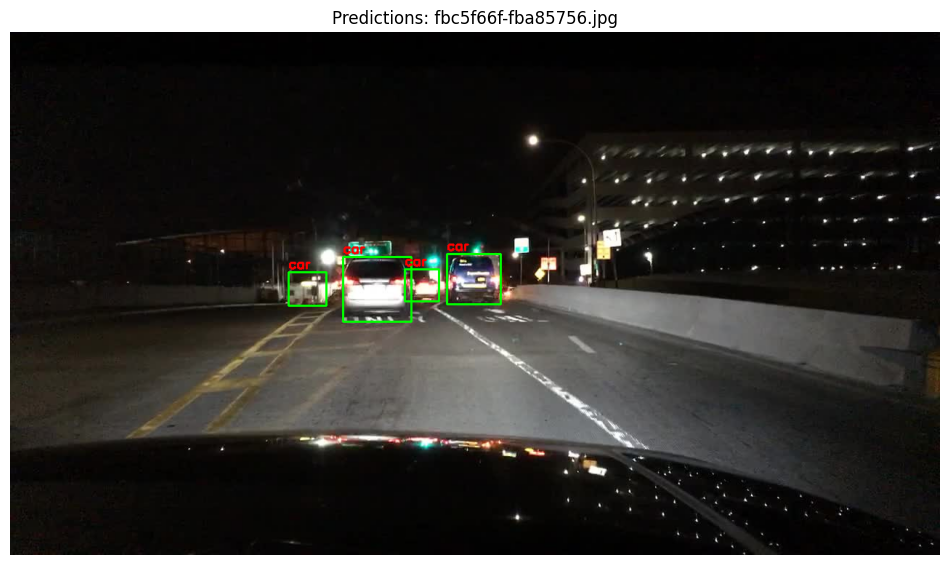

In [ ]:
# ✅ Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

import cv2
import matplotlib.pyplot as plt
import os

# ✅ Define class names for BDD100K (YOLO order)
class_names = [
    "bike", "bus", "car", "motor", "person",
    "rider", "traffic light", "traffic sign", "truck", "train"
]

# ✅ Directories
image_dir = "/content/drive/MyDrive/bdd100k_yolo/images/test"
label_dir = "/content/drive/MyDrive/yolo_test_preds/merged_labels"

# ✅ Replace with a real file name from your test set
sample_name = "fbc5f66f-fba85756.jpg"  # Change this if needed

# ✅ Construct full paths
img_path = os.path.join(image_dir, sample_name)
txt_path = os.path.join(label_dir, sample_name.replace(".jpg", ".txt"))

# ✅ Check if image exists
if not os.path.exists(img_path):
    print(f"❌ Image not found: {img_path}")
else:
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # ✅ Draw predicted boxes
    if os.path.exists(txt_path):
        with open(txt_path, 'r') as f:
            for line in f:
                cls, x_center, y_center, w, h = map(float, line.strip().split())
                class_id = int(cls)
                class_name = class_names[class_id] if class_id < len(class_names) else f"Class {class_id}"

                h_img, w_img = image.shape[:2]
                x1 = int((x_center - w / 2) * w_img)
                y1 = int((y_center - h / 2) * h_img)
                x2 = int((x_center + w / 2) * w_img)
                y2 = int((y_center + h / 2) * h_img)

                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(image, class_name, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

        # ✅ Display
        plt.figure(figsize=(12, 8))
        plt.imshow(image)
        plt.title(f"Predictions: {sample_name}")
        plt.axis('off')
        plt.show()
    else:
        print(f"⚠️ Label file not found for: {sample_name}")


# YOLO Predictions → COCO Format Conversion

In [ ]:
import os
import json
from tqdm import tqdm

# ✅ Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# === Paths ===
yolo_labels_dir = "/content/drive/MyDrive/yolo_test_preds/merged_labels"
image_dir = "/content/drive/MyDrive/bdd100k_yolo/images/test"
output_json = "/content/drive/MyDrive/yolo_test_preds/instances_test_preds.json"
processed_log = output_json.replace(".json", "_done.txt")

# === Classes used during training ===
class_names = [
    "bike", "bus", "car", "motor", "person",
    "rider", "traffic light", "traffic sign", "truck", "train"
]

# === Load previous state if exists
processed_files = set()
if os.path.exists(processed_log):
    with open(processed_log, "r") as f:
        processed_files = set(line.strip() for line in f)

# === Initialize COCO structure
coco = {
    "images": [],
    "annotations": [],
    "categories": [{"id": i, "name": name} for i, name in enumerate(class_names)]
}

annotation_id = 0
image_id = 0

# === Loop through images with matching labels
for fname in tqdm(os.listdir(yolo_labels_dir), desc="🔄 Converting to COCO"):
    if not fname.endswith(".txt"):
        continue

    base = fname.replace(".txt", "")
    if base in processed_files:
        continue

    img_path = os.path.join(image_dir, base + ".jpg")
    label_path = os.path.join(yolo_labels_dir, fname)

    if not os.path.exists(img_path):
        continue

    # Read image size
    try:
        from PIL import Image
        with Image.open(img_path) as img:
            width, height = img.size
    except:
        continue

    # Add image entry
    coco["images"].append({
        "id": image_id,
        "file_name": base + ".jpg",
        "width": width,
        "height": height
    })

    # Parse labels
    with open(label_path, "r") as f:
        for line in f:
            cls, x_center, y_center, w, h = map(float, line.strip().split())

            x = (x_center - w / 2) * width
            y = (y_center - h / 2) * height
            bw = w * width
            bh = h * height

            coco["annotations"].append({
                "id": annotation_id,
                "image_id": image_id,
                "category_id": int(cls),
                "bbox": [x, y, bw, bh],
                "area": bw * bh,
                "iscrowd": 0
            })
            annotation_id += 1

    image_id += 1
    processed_files.add(base)

    # Append to log (for resume)
    with open(processed_log, "a") as logf:
        logf.write(base + "\n")

# === Save JSON
with open(output_json, "w") as f:
    json.dump(coco, f, indent=2)

print(f"\n✅ COCO JSON saved to: {output_json}")
print(f"🧠 Total images: {len(coco['images'])}, annotations: {len(coco['annotations'])}")


Mounted at /content/drive


🔄 Converting to COCO: 100%|██████████| 19799/19799 [1:55:40<00:00,  2.85it/s]



✅ COCO JSON saved to: /content/drive/MyDrive/yolo_test_preds/instances_test_preds.json
🧠 Total images: 13849, annotations: 108063


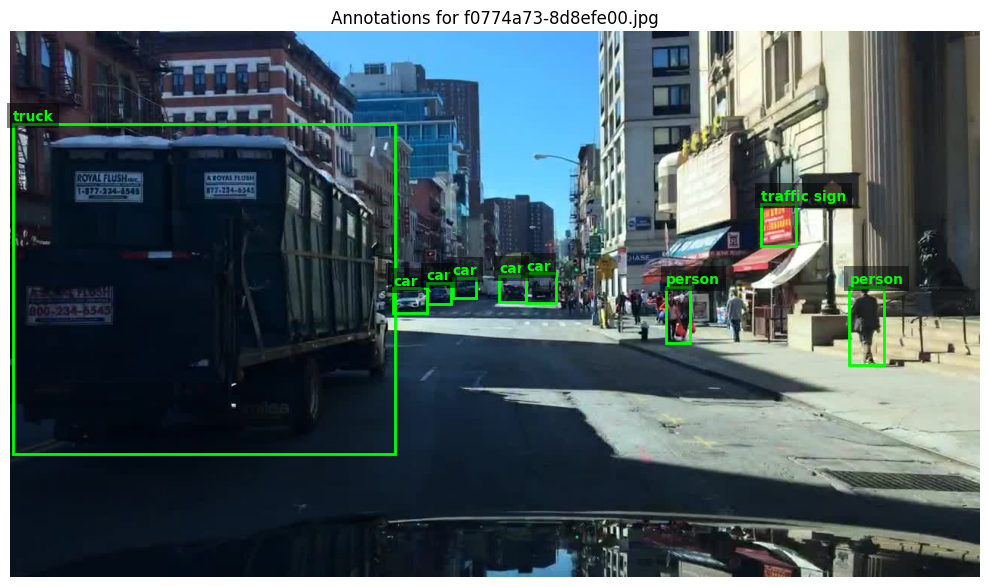

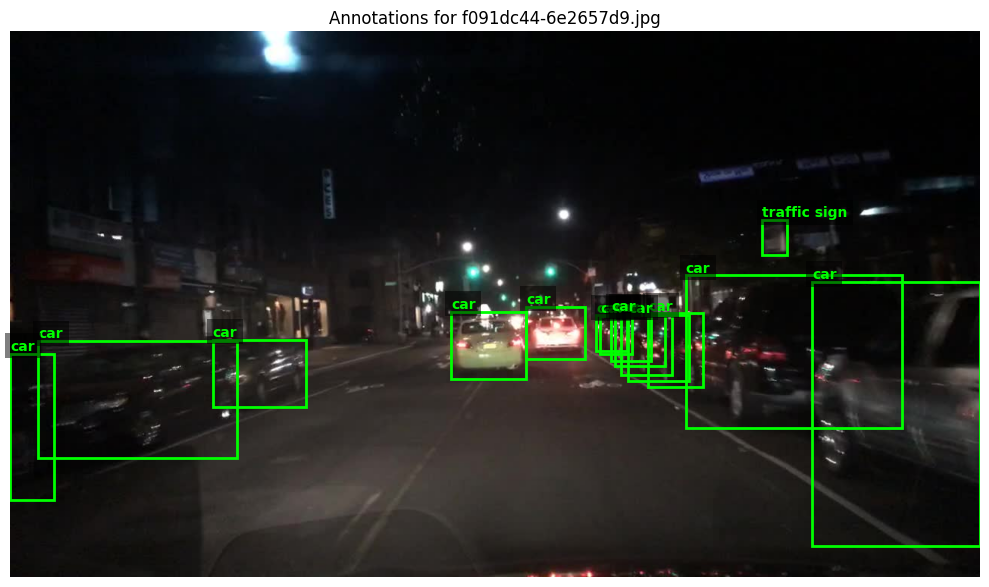

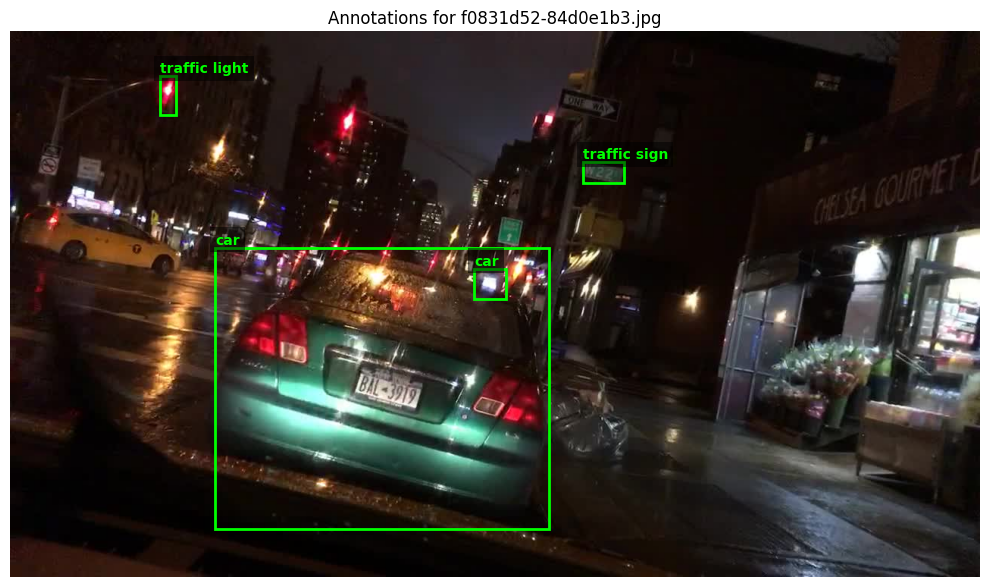

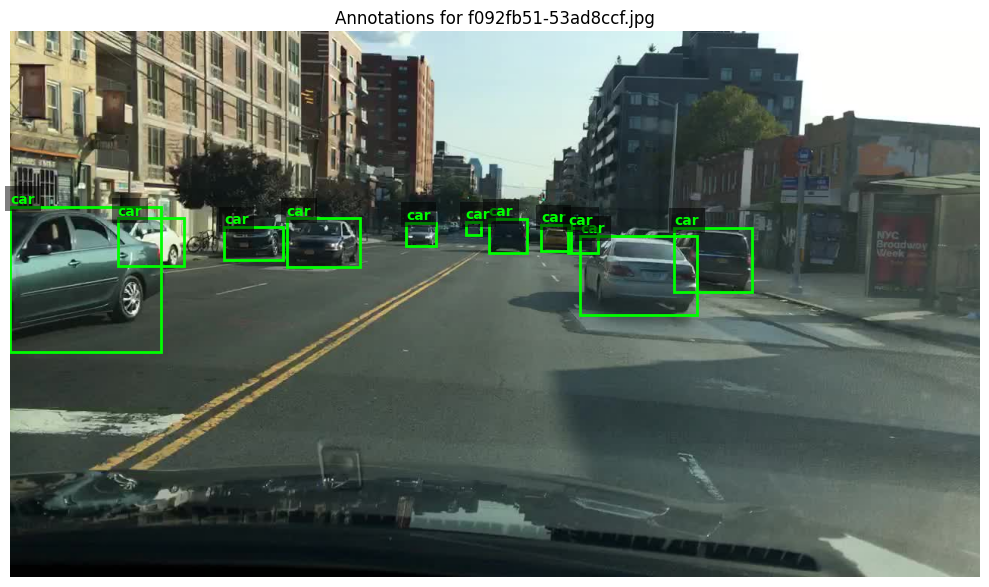

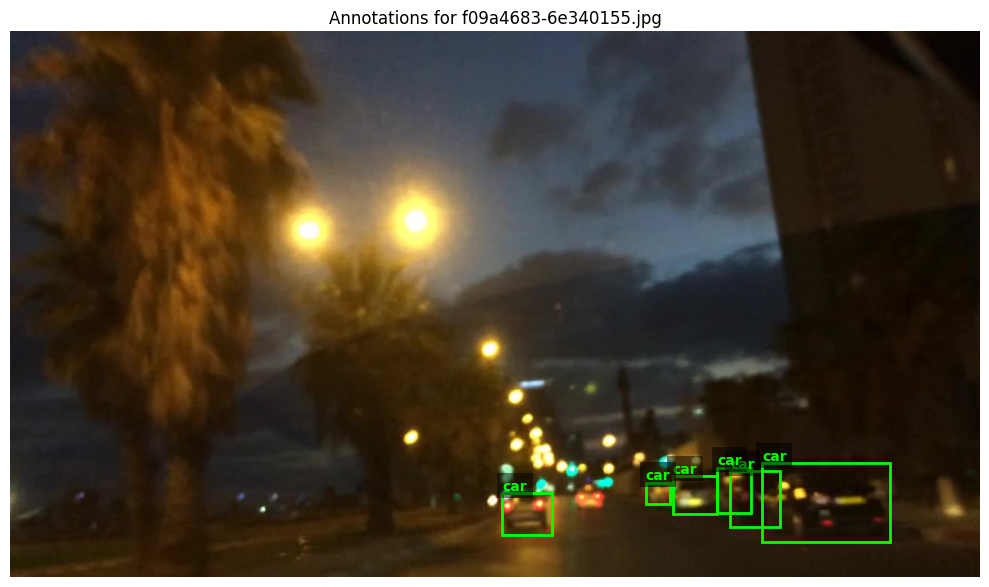

In [ ]:
import json
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# === Paths ===
image_dir = "/content/drive/MyDrive/bdd100k_yolo/images/test"
json_path = "/content/drive/MyDrive/yolo_test_preds/instances_test_preds.json"

# === Load COCO Annotations ===
with open(json_path, "r") as f:
    coco_data = json.load(f)

images = coco_data["images"]
annotations = coco_data["annotations"]
categories = {cat["id"]: cat["name"] for cat in coco_data["categories"]}

# === Build image_id to annotations mapping ===
from collections import defaultdict
ann_map = defaultdict(list)
for ann in annotations:
    ann_map[ann["image_id"]].append(ann)

# === Show N Sample Images ===
N = 5
sample_images = images[:N]

for img in sample_images:
    img_path = os.path.join(image_dir, img["file_name"])
    image = Image.open(img_path)
    w, h = image.size

    # Plot image
    fig, ax = plt.subplots(1, figsize=(10, 6))
    ax.imshow(image)

    # Plot annotations
    anns = ann_map[img["id"]]
    for ann in anns:
        x, y, box_w, box_h = ann["bbox"]
        category = categories[ann["category_id"]]
        rect = patches.Rectangle((x, y), box_w, box_h, linewidth=2,
                                 edgecolor='lime', facecolor='none')
        ax.add_patch(rect)
        ax.text(x, y - 5, category, color='lime',
                fontsize=10, weight='bold',
                bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))

    ax.set_title(f"Annotations for {img['file_name']}")
    ax.axis("off")
    plt.tight_layout()
    plt.show()


# **PHASE FIVE: SIMULATION**

# ** SUMO TraCI Simulation**

In [ ]:
# ✅ Step 1: Install SUMO in Colab (only once per session)
!add-apt-repository ppa:sumo/stable -y > /dev/null 2>&1
!apt-get update -y > /dev/null 2>&1
!apt-get install -y sumo sumo-tools sumo-doc > /dev/null 2>&1

# ✅ Step 2: Create simulation files
import os

sim_dir = "/content/drive/MyDrive/sumo_sim"
os.makedirs(sim_dir, exist_ok=True)

# --- net.net.xml ---
with open(f"{sim_dir}/net.net.xml", "w") as f:
    f.write("""<net>
  <location netOffset="0,0" convBoundary="0,0,500,500" origBoundary="0,0,500,500"/>
  <edge id="e1" from="n1" to="n2" priority="1">
    <lane id="e1_0" index="0" speed="13.89" length="500" shape="0,0 500,0"/>
  </edge>
  <junction id="n1" x="0" y="0" type="priority" />
  <junction id="n2" x="500" y="0" type="priority" />
</net>""")

# --- route.rou.xml ---
with open(f"{sim_dir}/route.rou.xml", "w") as f:
    f.write("""<routes>
  <vType id="car" accel="1.0" decel="4.5" sigma="0.5" length="5" maxSpeed="20"/>
  <route id="r1" edges="e1"/>
  <vehicle id="veh1" type="car" route="r1" depart="0"/>
</routes>""")

# --- sumo.sumocfg ---
with open(f"{sim_dir}/sumo.sumocfg", "w") as f:
    f.write(f"""<configuration>
  <input>
    <net-file value="net.net.xml"/>
    <route-files value="route.rou.xml"/>
  </input>
  <time>
    <begin value="0"/>
    <end value="100"/>
    <step-length value="1.0"/>
  </time>
  <report>
    <write-tripinfo value="tripinfo.xml"/>
  </report>
</configuration>""")


In [ ]:
!sumo -c /content/drive/MyDrive/sumo_sim/sumo.sumocfg


Error: No option with the name 'write-tripinfo' exists.
Error: Could not load configuration '/content/drive/MyDrive/sumo_sim/sumo.sumocfg'.
Quitting (on error).


In [ ]:
!ls /content/drive/MyDrive/sumo_sim


net.net.xml    simple.net.xml  simple.sumocfg
route.rou.xml  simple.rou.xml  sumo.sumocfg


In [ ]:
from sumolib.output import parse
import matplotlib.pyplot as plt

tripinfo_path = "/content/drive/MyDrive/sumo_sim/tripinfo.xml"

# ✅ Read trip durations
durations = []
vehicle_ids = []

for trip in parse(tripinfo_path, 'tripinfo'):
    print(f"🚗 {trip.id}: duration={trip.duration:.2f}s, departed at {trip.depart}, arrived at {trip.arrival}")
    durations.append(trip.duration)
    vehicle_ids.append(trip.id)

# ✅ Plot trip durations
plt.figure(figsize=(10,5))
plt.bar(vehicle_ids, durations, color='teal')
plt.xlabel("Vehicle ID")
plt.ylabel("Trip Duration (s)")
plt.title("Vehicle Trip Durations from SUMO Batch Run")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/sumo_sim/tripinfo.xml'

In [ ]:
# ✅ Step 3: Run SUMO and wait (simulate traffic)
!sumo -c /content/drive/MyDrive/sumo_sim/sumo.sumocfg --no-step-log --quit-on-end


Error: No option with the name 'write-tripinfo' exists.
Error: Could not load configuration '/content/drive/MyDrive/sumo_sim/sumo.sumocfg'.
Quitting (on error).


In [ ]:
!pkill -f sumo || true

from sumolib import checkBinary
import traci, time, os

sumo_binary = checkBinary("sumo")
config_path = "/content/drive/MyDrive/sumo_sim/sumo.sumocfg"

for attempt in range(5):
    try:
        traci.start([
            sumo_binary,
            "-c", config_path,
            "--step-length", "1.0",
            "--no-step-log", "true"
        ])
        print("✅ SUMO started")
        break
    except Exception as e:
        print(f"❌ Attempt {attempt+1} failed:", e)
        time.sleep(3)
        continue
else:
    raise RuntimeError("SUMO failed to launch via TraCI.")

# Run!
for _ in range(100):
    traci.simulationStep()
traci.close()
print("✅ Done simulation")


^C
 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 33073 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 52499 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 43955 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 42257 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 55995 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 42459 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 35327 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 51807 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 35777 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 56173 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 50517 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 36899 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 40035 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 45813 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58273 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 45655 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 60153 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 42691 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 34485 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 42595 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44049 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 56367 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 55311 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 38319 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44847 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 51727 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 49675 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 52977 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 37253 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 39025 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 47757 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 42747 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 55573 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 50029 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 35017 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 41611 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 43617 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 56893 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 47107 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 42905 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 45257 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 35097 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 56025 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 57061 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44305 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 43487 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 37041 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 41679 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 41565 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 40373 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 33159 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58687 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44047 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 41399 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 48247 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 46009 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 60329 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 36445 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 35147 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 59157 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


❌ Attempt 1 failed: Could not connect in 1 tries
 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 60513 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 45963 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 34099 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 34521 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 56411 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 48463 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 43681 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 60585 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 56841 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 59419 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 57385 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 41113 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 56423 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 36253 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 37131 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 50623 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 33873 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 37675 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 57727 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 37717 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 60199 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 40075 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58615 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 60167 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 42333 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 45349 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 49885 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 36027 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 34273 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 36321 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 54811 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 38435 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 32989 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 53197 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44781 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 37187 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58761 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 55989 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 38585 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 60643 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 33005 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 59143 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 51515 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 33813 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 60531 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 38221 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58759 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 54351 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds
 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 35123 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 37311 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 49799 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 59741 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 45259 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 33373 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 55721 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 35499 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 43839 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 54029 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 41221 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


❌ Attempt 2 failed: Could not connect in 1 tries
 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 37877 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 59563 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 46787 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 48199 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 53109 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 57411 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 59429 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 35055 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58583 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 38547 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 57677 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 46883 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 42229 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 59883 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58843 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 48489 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 33899 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 52991 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58733 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 50507 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 45415 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 54819 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 47497 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 60595 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 51721 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58471 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 37919 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 54253 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 34483 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58293 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 53897 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 50297 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 35797 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 40129 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 43245 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 54343 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 33569 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 41473 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 51183 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 50599 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 51129 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44613 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44535 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 48959 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 40267 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 32809 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 40969 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 40961 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58899 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 43249 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 54687 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58209 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 45289 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 55525 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 49323 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 40621 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58417 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 48681 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 53669 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 59737 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


❌ Attempt 3 failed: Could not connect in 1 tries
 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 33043 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 60955 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 47523 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 54775 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 40385 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 55247 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 40817 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 42671 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 54667 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 41745 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44915 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 35297 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 53257 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 53207 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 50321 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 53077 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 54089 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 34503 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 48185 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 38925 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44069 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 33229 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44365 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 59833 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 59119 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 34339 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 48553 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 50893 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 54463 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 36775 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 51691 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 48749 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 41617 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds
 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 60205 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 46855 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44525 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 47401 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58955 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 35081 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 33683 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 46059 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 42525 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 47473 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 49355 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 52491 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 54891 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 40849 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58463 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 42581 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 50095 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44759 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 35963 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 56195 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 45839 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 43717 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 40133 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 46181 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 37153 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44897 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


❌ Attempt 4 failed: Could not connect in 1 tries
 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 33463 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 41985 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 47469 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 38885 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 55985 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 60553 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 56059 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 48875 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 55833 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 33035 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 42339 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44149 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 53643 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 47031 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 39807 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 46859 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58531 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 48433 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 39199 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 60499 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 33537 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 47667 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 49987 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 42987 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 37735 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 60225 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44961 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 33589 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58861 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 45629 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 36541 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 34529 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 60939 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 39167 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 46331 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 41303 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 57403 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 47241 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 42969 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 56865 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 38137 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 50467 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 34649 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 46053 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 35719 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 53417 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 39347 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 47849 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 38093 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 38663 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds
 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 56883 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 54699 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58851 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 37279 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 40551 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 45091 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 41067 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 55813 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 48931 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


❌ Attempt 5 failed: Could not connect in 1 tries


RuntimeError: SUMO failed to launch via TraCI.

In [ ]:
from sumolib.xml import parse
import os
import time

sumo_binary = checkBinary("sumo")
config_path = "/content/drive/MyDrive/sumo_sim/sumo.sumocfg"
tripinfo_path = "/content/drive/MyDrive/sumo_sim/tripinfo.xml"

# Make sure any old connection is closed
try:
    traci.close()
except:
    pass

print("🚦 Starting SUMO...")
try:
    traci.start([sumo_binary, "-c", config_path, "--no-step-log", "true"])
    time.sleep(5)  # let SUMO run a bit
    for _ in range(100):
        traci.simulationStep()
    traci.close()
    print("✅ SUMO simulation finished.")
except Exception as e:
    print("❌ Failed to start SUMO:", e)


🚦 Starting SUMO...
 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 51769 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44425 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 58921 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 46929 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 45657 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 35261 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 52011 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 33709 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 46245 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 54455 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 40931 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 53851 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 42083 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 37529 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 56075 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 50199 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 37245 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 53823 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 56395 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 57489 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44025 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 41089 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 41021 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 52999 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 50581 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 40471 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 42967 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 45109 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 51109 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 48099 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 55233 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 38279 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 57391 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 49417 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44911 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 59971 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 37287 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 33647 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 53913 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 33419 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 59909 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 36227 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 57181 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 49797 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 56463 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 34017 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 42623 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 51039 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 52073 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 46001 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 60733 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 43413 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 46315 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 44057 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 52961 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 37115 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 49871 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 36039 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 38617 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


 Retrying in 1 seconds
❌ Failed to start SUMO: Could not connect in 1 tries


/usr/local/lib/python3.11/dist-packages/traci/main.py:156: UserWarning: Could not connect to TraCI server using port 42527 (TraCI server already finished). Retrying with different port.
  warnings.warn(("Could not connect to TraCI server using port %s (%s)." +


In [ ]:
# ✅ Step 4: Analyze trip info using sumolib
!pip install sumolib > /dev/null

from sumolib.output import parse

tripinfo_path = "/content/drive/MyDrive/sumo_sim/tripinfo.xml"

# Parse the tripinfo.xml
trip_durations = []
for trip in parse(tripinfo_path, 'tripinfo'):
    print(f"Vehicle {trip.id} | Duration: {trip.duration:.2f}s | Depart: {trip.depart} | Arrival: {trip.arrival}")
    trip_durations.append(trip.duration)


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/sumo_sim/tripinfo.xml'

In [ ]:
# --- STEP 1: Install SUMO system binaries ----------
!apt-get update -y
!apt-get install -y software-properties-common
!add-apt-repository ppa:sumo/stable -y
!apt-get update -y
!apt-get install -y sumo sumo-tools sumo-doc


Hit:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:4 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:6 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:7 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:9 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/sumo/stable/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspe

In [ ]:
# --- STEP 2: Install Python bindings ----------
!pip install -q traci sumolib

import os, matplotlib.pyplot as plt
import traci
from sumolib import checkBinary


In [ ]:
!sumo --version

Eclipse SUMO sumo Version 1.23.1
 Build features: Linux-6.8.0-59-generic x86_64 GNU 11.4.0 Release FMI Proj GUI Intl SWIG Eigen GDAL GL2PS
 Copyright (C) 2001-2025 German Aerospace Center (DLR) and others; https://sumo.dlr.de

Eclipse SUMO sumo Version 1.23.1 is part of SUMO.
This program and the accompanying materials
are made available under the terms of the Eclipse Public License v2.0
which accompanies this distribution, and is available at
http://www.eclipse.org/legal/epl-v20.html
This program may also be made available under the following Secondary
Licenses when the conditions for such availability set forth in the Eclipse
Public License 2.0 are satisfied: GNU General Public License, version 2
or later which is available at
https://www.gnu.org/licenses/old-licenses/gpl-2.0-standalone.html
SPDX-License-Identifier: EPL-2.0 OR GPL-2.0-or-later


In [ ]:

# Print to confirm
print("✅ SUMO Binary:", sumo_bin)

✅ SUMO Binary: /usr/share/sumo/bin/sumo


In [ ]:
# --- STEP 3: Prepare SUMO network and route files ----------
# ✅ Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

sim_dir = "/content/drive/MyDrive/sumo_sim"
os.makedirs(sim_dir, exist_ok=True)
with open(os.path.join(sim_dir, "net.net.xml"), 'w') as f:
    f.write("""<net>
  <location netOffset="0,0" convBoundary="0,0,500,0" origBoundary="0,0,500,0"/>
  <edge id="e1" from="n1" to="n2" priority="1">
    <lane id="e1_0" index="0" speed="13.89" length="500" shape="0.00,0.00 500.00,0.00"/>
  </edge>
  <junction id="n1" x="0.00" y="0.00" type="priority"/>
  <junction id="n2" x="500.00" y="0.00" type="priority"/>
</net>""")
with open(os.path.join(sim_dir, "route.rou.xml"), 'w') as f:
    f.write("""<routes>
  <vType id="car" accel="1.0" decel="4.5" sigma="0.5" length="5" maxSpeed="20"/>
  <route id="r1" edges="e1"/>
  <vehicle id="veh1" type="car" route="r1" depart="0"/>
</routes>""")
with open(os.path.join(sim_dir, "sumo.sumocfg"), 'w') as f:
    f.write(f"""<configuration>
  <input>
    <net-file value="net.net.xml"/>
    <route-files value="route.rou.xml"/>
  </input>
  <time>
    <begin value="0"/>
    <end value="50"/>
  </time>
</configuration>""")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!cat /content/drive/MyDrive/sumo_sim/sumo.sumocfg

<configuration>
  <input>
    <net-file value="net.net.xml"/>
    <route-files value="route.rou.xml"/>
  </input>
  <time>
    <begin value="0"/>
    <end value="50"/>
  </time>
</configuration>

In [ ]:
!cat /content/drive/MyDrive/sumo_sim/route.rou.xml

<routes>
  <vType id="car" accel="1.0" decel="4.5" sigma="0.5" length="5" maxSpeed="20"/>
  <route id="r1" edges="e1"/>
  <vehicle id="veh1" type="car" route="r1" depart="0"/>
</routes>

In [ ]:
!cat /content/drive/MyDrive/sumo_sim/net.net.xml

<net>
  <location netOffset="0,0" convBoundary="0,0,500,0" origBoundary="0,0,500,0"/>
  <edge id="e1" from="n1" to="n2" priority="1">
    <lane id="e1_0" index="0" speed="13.89" length="500" shape="0.00,0.00 500.00,0.00"/>
  </edge>
  <junction id="n1" x="0.00" y="0.00" type="priority"/>
  <junction id="n2" x="500.00" y="0.00" type="priority"/>
</net>

In [ ]:
assert os.path.exists(os.path.join(sim_dir, "net.net.xml")), "❌ net.net.xml not found!"
assert os.path.exists(os.path.join(sim_dir, "route.rou.xml")), "❌ route.rou.xml not found!"
assert os.path.exists(os.path.join(sim_dir, "sumo.sumocfg")), "❌ sumo.sumocfg not found!"
print("✅ All required files found!")


✅ All required files found!


In [ ]:
import traci
from traci.exceptions import TraCIException

# Kill existing connections (safe)
try:
    traci.close()
    print("🔌 Closed existing TraCI connection.")
except:
    pass


🔌 Closed existing TraCI connection.


In [ ]:
import os
import traci
from sumolib import checkBinary

sim_dir = "/content/drive/MyDrive/sumo_sim"
config_path = os.path.join(sim_dir, "sumo.sumocfg")

# Ensure all files exist
for f in ["net.net.xml", "route.rou.xml", "sumo.sumocfg"]:
    assert os.path.exists(os.path.join(sim_dir, f)), f"Missing {f}"

# Close any open connection
try:
    traci.close()
    print("🔌 Closed existing TraCI connection.")
except:
    pass

# Start SUMO
print("🚦 Starting SUMO...")
sumo_binary = checkBinary("sumo")
try:
    traci.start([sumo_binary, "-c", config_path, "--no-step-log", "true"])
    print("✅ SUMO started successfully.")
except Exception as e:
    print("❌ Failed to start SUMO:", e)


🚦 Starting SUMO...
 Retrying in 1 seconds
❌ Failed to start SUMO: Connection closed by SUMO.


In [ ]:
import os
from sumolib import checkBinary
import traci

sumo_bin = checkBinary("sumo")
config_file = os.path.join(sim_dir, "sumo.sumocfg")

print("🚦 Starting SUMO...")

try:
    traci.start([sumo_bin, "-c", config_file, "--no-step-log", "true"])
    print("✅ SUMO started successfully.")
except Exception as e:
    print("❌ Failed to start SUMO:", e)


🚦 Starting SUMO...
 Retrying in 1 seconds
❌ Failed to start SUMO: Connection closed by SUMO.


In [ ]:
!sumo -c /content/drive/MyDrive/sumo_sim/sumo.sumocfg


In [ ]:
# --- STEP 4: Run and visualize simulation ----------

# 🔁 Safe SUMO simulation launch
try:
    traci.close()
    print("🔌 Closed existing TraCI connection.")
except traci.exceptions.FatalTraCIError:
    print("⚠️ No active TraCI session.")
except Exception as e:
    print(f"⚠️ Unexpected TraCI error: {e}")

print("🚦 Starting SUMO...")
traci.start([sumo_bin, "-c", os.path.join(sim_dir, "sumo.sumocfg")])
sumo_bin = checkBinary("sumo")  # headless
print("🚦 Starting SUMO...")
!pkill -f sumo  # kill stray processes
traci.start([sumo_bin, "-c", os.path.join(sim_dir, "sumo.sumocfg")])
x, y = [], []
for _ in range(100):
    traci.simulationStep()
    vehs = traci.vehicle.getIDList()
    if vehs:
        pos = traci.vehicle.getPosition(vehs[0])
        x.append(pos[0]); y.append(pos[1])
traci.close()

plt.figure(figsize=(6,4))
plt.plot(x, y, marker='o')
plt.title("Vehicle Trajectory")
plt.xlabel("X (m)"); plt.ylabel("Y (m)")
plt.grid(True)
plt.show()


🔌 Closed existing TraCI connection.
🚦 Starting SUMO...
 Retrying in 1 seconds


FatalTraCIError: Connection closed by SUMO.

In [ ]:
!git clone https://github.com/BilHim/trafficSimulator.git
%cd trafficSimulator


Cloning into 'trafficSimulator'...
remote: Enumerating objects: 191, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 191 (delta 19), reused 13 (delta 13), pack-reused 163 (from 2)
Receiving objects: 100% (191/191), 77.37 KiB | 720.00 KiB/s, done.
Resolving deltas: 100% (42/42), done.
/content/trafficSimulator/trafficSimulator/trafficSimulator/trafficSimulator


In [ ]:
!ls


CONTRIBUTING.md  images   MANIFEST.in	  README.md	    src    tox.ini
examples	 LICENSE  pyproject.toml  requirements.txt  tests


In [ ]:
import sys
sys.path.append("/content/trafficSimulator/src")


In [ ]:
!ls /content/trafficSimulator/src


trafficSimulator


In [ ]:
!ls /content/trafficSimulator/src/trafficSimulator


core  __init__.py  visualizer


In [ ]:
!grep -r "class Simulation" /content/trafficSimulator/src/trafficSimulator


/content/trafficSimulator/src/trafficSimulator/core/simulation.py:class Simulation:


In [ ]:
# Inspect available methods in the Simulation class
dir(sim)


['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 'add_segment',
 'add_vehicle',
 'add_vehicle_generator',
 'create_cubic_bezier_curve',
 'create_quadratic_bezier_curve',
 'create_segment',
 'create_vehicle',
 'create_vehicle_generator',
 'dt',
 'frame_count',
 'run',
 'segments',
 't',
 'update',
 'vehicle_generator',
 'vehicles']

In [ ]:
!ls /content/trafficSimulator/src/trafficSimulator/core


geometry  simulation.py  vehicle_generator.py  vehicle.py


In [ ]:
!find /content/trafficSimulator -name "vehicleGenerator.py"


In [ ]:
!find /content/trafficSimulator -name "vehicleGenerator.py"


In [ ]:
%cd /content/trafficSimulator/src
!pip install -e .


/content/trafficSimulator/src
Obtaining file:///content/trafficSimulator/src
ERROR: file:///content/trafficSimulator/src does not appear to be a Python project: neither 'setup.py' nor 'pyproject.toml' found.


In [ ]:
!ls /content/trafficSimulator/src/trafficSimulator/core/geometry


cubic_curve.py	__pycache__  quadratic_curve.py  segment.py


In [ ]:
!cat /content/trafficSimulator/src/trafficSimulator/core/geometry/quadratic_curve.py


from .segment import Segment

PAS = 0.01
CURVE_RESOLUTION = 50

class QuadraticCurve(Segment):
    def __init__(self, start, control, end):
        # Store characteristic points
        self.start = start
        self.control = control
        self.end = end

        # Generate path
        path = []
        for i in range(CURVE_RESOLUTION):
            t = i/(CURVE_RESOLUTION-1)
            x = t**2*self.end[0] + 2*t*(1-t)*self.control[0] + (1-t)**2*self.start[0]
            y = t**2*self.end[1] + 2*t*(1-t)*self.control[1] + (1-t)**2*self.start[1]
            path.append((x, y))

        super().__init__(path)

        # Arc-length parametrization
        normalized_path = self.find_normalized_path(CURVE_RESOLUTION)
        super().__init__(normalized_path)

    def compute_x(self, t):
        return t**2*self.end[0] + 2*t*(1-t)*self.control[0] + (1-t)**2*self.start[0]
    def compute_y(self, t):
        return t**2*self.end[1] + 2*t*(1-t)*self.control[1] + (1-t)**2*self.start[1]
    

In [ ]:
!head -n 20 /content/trafficSimulator/src/trafficSimulator/core/vehicle.py


import uuid
import numpy as np

class Vehicle:
    def __init__(self, config={}):
        # Set default configuration
        self.set_default_config()

        # Update configuration
        for attr, val in config.items():
            setattr(self, attr, val)

        # Calculate properties
        self.init_properties()
        
    def set_default_config(self):    
        self.id = uuid.uuid4()

        self.l = 4
        self.s0 = 4


In [ ]:
!cat /content/trafficSimulator/src/trafficSimulator/core/vehicle.py

import uuid
import numpy as np

class Vehicle:
    def __init__(self, config={}):
        # Set default configuration
        self.set_default_config()

        # Update configuration
        for attr, val in config.items():
            setattr(self, attr, val)

        # Calculate properties
        self.init_properties()
        
    def set_default_config(self):    
        self.id = uuid.uuid4()

        self.l = 4
        self.s0 = 4
        self.T = 1
        self.v_max = 16.6
        self.a_max = 1.44
        self.b_max = 4.61

        self.path = []
        self.current_road_index = 0

        self.x = 0
        self.v = 0
        self.a = 0
        self.stopped = False

    def init_properties(self):
        self.sqrt_ab = 2*np.sqrt(self.a_max*self.b_max)
        self._v_max = self.v_max

    def update(self, lead, dt):
        # Update position and velocity
        if self.v + self.a*dt < 0:
            self.x -= 1/2*self.v*self.v/self.a
            self.v = 0
        else:
 

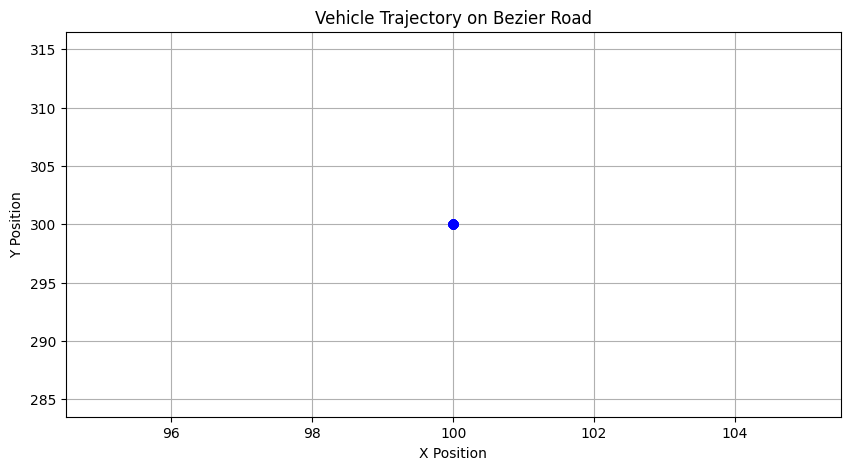

In [ ]:
import sys
import os
import matplotlib.pyplot as plt

# ✅ Step 1: Add path to simulation core folder
core_path = "/content/trafficSimulator/src/trafficSimulator/core"
sys.path.append(core_path)

# ✅ Step 2: Now import classes using absolute imports
from core.simulation import Simulation
from core.vehicle import Vehicle
from geometry.quadratic_curve import QuadraticCurve

# ✅ Step 3: Initialize the simulation
sim = Simulation()

# ✅ Step 4: Create a quadratic Bezier road segment
road = QuadraticCurve((100, 300), (300, 200), (500, 300))
sim.add_segment(road)

# ✅ Step 5: Add a vehicle to the road
car = Vehicle(config={
    "road": road,
    "v": 10,      # initial velocity
    "x": 0        # optional: initial position along the segment
})
sim.add_vehicle(car)

# ✅ Step 6: Run simulation
x, y = car.road.compute_x(car.x), car.road.compute_y(car.x)
x_vals, y_vals = [], []

for _ in range(100):
    sim.update()
    x_vals.append(car.road.compute_x(car.x))
    y_vals.append(car.road.compute_y(car.x))


# ✅ Step 7: Plot vehicle path
plt.figure(figsize=(10, 5))
plt.plot(x_vals, y_vals, marker="o", linestyle="--", color="blue")
plt.title("Vehicle Trajectory on Bezier Road")
plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.grid(True)
plt.show()


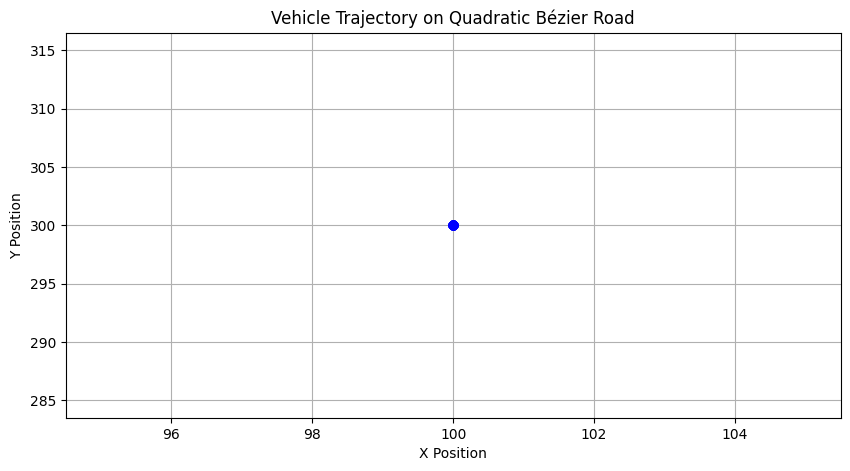

In [ ]:
# ✅ STEP 1: Setup
import sys
import os
import matplotlib.pyplot as plt

# Add the traffic simulator core path
core_path = "/content/trafficSimulator/src/trafficSimulator/core"
sys.path.append(core_path)

# ✅ STEP 2: Import classes
from core.simulation import Simulation
from core.vehicle import Vehicle
from geometry.quadratic_curve import QuadraticCurve

# ✅ STEP 3: Initialize simulation
sim = Simulation()

# ✅ STEP 4: Create a quadratic Bézier road segment (start, control, end)
road = QuadraticCurve((100, 300), (300, 200), (500, 300))
sim.add_segment(road)

# ✅ STEP 5: Add a vehicle to the road (with velocity and position)
car = Vehicle({
    "road": road,
    "v": 5.0,      # Initial velocity (pixels/s)
    "x": 0.0       # Position on the curve (0=start, 1=end)
})
sim.add_vehicle(car)

# ✅ STEP 6: Run simulation and collect position
x_vals, y_vals = [], []
for _ in range(100):
    sim.update()
    x_vals.append(car.road.compute_x(car.x))
    y_vals.append(car.road.compute_y(car.x))

# ✅ STEP 7: Plot trajectory
plt.figure(figsize=(10, 5))
plt.plot(x_vals, y_vals, marker="o", linestyle="--", color="blue")
plt.title("Vehicle Trajectory on Quadratic Bézier Road")
plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.grid(True)
plt.show()


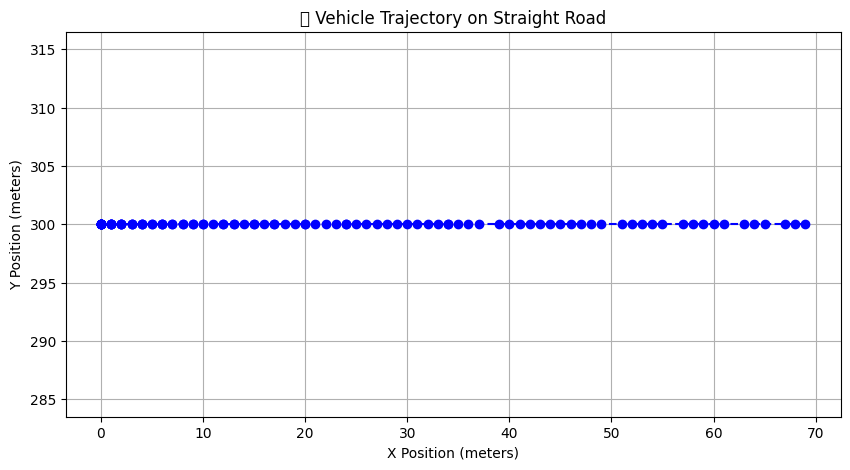

In [ ]:
# ✅ STEP 1: Imports
import uuid
import numpy as np
import matplotlib.pyplot as plt

# ✅ STEP 2: Define your own Vehicle class (bypassing trafficSimulator)
class Vehicle:
    def __init__(self):
        self.id = uuid.uuid4()
        self.l = 4
        self.s0 = 4
        self.T = 1
        self.v_max = 16.6
        self.a_max = 1.44
        self.b_max = 4.61

        self.x = 0
        self.v = 0
        self.a = 0
        self.stopped = False

        self.sqrt_ab = 2 * np.sqrt(self.a_max * self.b_max)

    def update(self, lead, dt):
        if self.v + self.a * dt < 0:
            self.x -= 0.5 * self.v * self.v / self.a
            self.v = 0
        else:
            self.v += self.a * dt
            self.x += self.v * dt + 0.5 * self.a * dt * dt

        alpha = 0
        if lead:
            delta_x = lead.x - self.x - lead.l
            delta_v = self.v - lead.v
            alpha = (self.s0 + max(0, self.T * self.v + delta_v * self.v / self.sqrt_ab)) / delta_x

        self.a = self.a_max * (1 - (self.v / self.v_max) ** 4 - alpha ** 2)

        if self.stopped:
            self.a = -self.b_max * self.v / self.v_max

# ✅ STEP 3: Create a synthetic road (linear or curved)
def create_road(length=100):
    return [(x, 300) for x in range(0, length, 1)]

road_points = create_road(300)

# ✅ STEP 4: Initialize your own vehicle
car = Vehicle()

# ✅ STEP 5: Run the simulation
x_vals = []
y_vals = []

dt = 0.1  # time step
for _ in range(100):
    car.update(lead=None, dt=dt)
    x = int(min(car.x, len(road_points) - 1))  # Clamp to road length
    pos = road_points[x]
    x_vals.append(pos[0])
    y_vals.append(pos[1])

# ✅ STEP 6: Plot the vehicle trajectory
plt.figure(figsize=(10, 5))
plt.plot(x_vals, y_vals, marker="o", linestyle="--", color="blue")
plt.title("🚗 Vehicle Trajectory on Straight Road")
plt.xlabel("X Position (meters)")
plt.ylabel("Y Position (meters)")
plt.grid(True)
plt.show()
